In [1]:
import os
import json
import itertools
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import torch
%matplotlib inline

In [2]:
filename="/q4_train.csv"
DATA_DIR = os.path.join(os.path.abspath("../.."),"Data","quartiles")
conditionCols=['finalResult','codeModule','moduleSession']
suffix='Q4-'

In [3]:
DATA_DIR

'/home/slab/Hajra/GANs_2020/Quartile Work/Concat_CGAN_Quarters/Data/quartiles'

In [4]:
df = pd.read_csv(DATA_DIR+filename)
targetColumns=df.columns
columnsToSelect=[suffix+col if col not in conditionCols else col  for col in targetColumns]
df.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,1,0,0.0,0,0.0,0.0,20.0,0.0,9.0,...,0.0,0.0,0.0,0.0,0.0,0,2.0,0.0,2.0,0.0
1,Pass,5,0,29.0,0,0.0,0.0,22.0,0.0,55.0,...,0.0,1.0,7.0,12.0,65.0,0,4.0,0.0,23.0,2.0
2,Pass,6,1,0.0,0,0.0,0.0,0.0,0.0,13.0,...,0.0,0.0,0.0,0.0,81.0,0,2.0,0.0,1.0,0.0
3,Fail,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
4,Fail,2,0,0.0,0,0.0,0.0,0.0,0.0,33.0,...,0.0,0.0,0.0,0.0,240.0,0,16.0,0.0,4.0,0.0


In [5]:
columnsToSelect

['finalResult',
 'codeModule',
 'moduleSession',
 'Q4-ExternalQuiz',
 'Q4-DataPlus',
 'Q4-DualPlus',
 'Q4-Folder',
 'Q4-Forumng',
 'Q4-Glossary',
 'Q4-HomePage',
 'Q4-HtmlActivity',
 'Q4-OuCollaborate',
 'Q4-OuContent',
 'Q4-OuElluminate',
 'Q4-OuWiki',
 'Q4-PageClicks',
 'Q4-Questionnaire',
 'Q4-Quiz',
 'Q4-RepeatActivity',
 'Q4-Resource',
 'Q4-SharedSubPage',
 'Q4-SubPage',
 'Q4-Url']

In [6]:
# df=pd.read_csv("/home/slab/Hajra/GANs_2020/Quartile Work/Concat_CGAN_Quarters/Data/quartiles/q2_train.csv")
# targetColumns=df.columns
# columnsToSelect=[suffix+col if col not in conditionCols else col  for col in targetColumns]
# df.head()

###  X=Q4 original 
 ### Y=Synthteic (Q1,Q2,Q3)

In [5]:
filenameQ1="../CGAN Q1/Q1_Synthetic.csv" 

q1Synth = pd.read_csv(filenameQ1)

labels,codeValues = pd.factorize(q1Synth['codeModule'])
q1Synth.codeModule=labels
labels,moduleValues = pd.factorize(q1Synth['moduleSession'])
q1Synth.moduleSession=labels

q1Synth.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,0,0,4.0,0.0,0.0,4.0,6.0,3.0,3.0,...,2.0,6.0,1.0,4.0,13.0,11.0,16.0,6.0,4.0,17.0
1,Pass,0,0,2.0,4.0,2.0,3.0,4.0,2.0,2.0,...,3.0,5.0,3.0,2.0,0.0,3.0,0.0,2.0,1.0,1.0
2,Pass,0,0,1.0,7.0,2.0,0.0,4.0,4.0,1.0,...,1.0,2.0,8.0,3.0,3.0,0.0,0.0,0.0,4.0,9.0
3,Pass,0,0,7.0,3.0,6.0,0.0,7.0,0.0,3.0,...,2.0,4.0,1.0,0.0,17.0,2.0,14.0,5.0,5.0,0.0
4,Pass,0,0,4.0,2.0,3.0,6.0,4.0,2.0,2.0,...,3.0,3.0,3.0,3.0,0.0,2.0,6.0,1.0,2.0,10.0


In [6]:
filenameQ1="../CGAN Q2/Q2_synthetic_cond_Q1_2kEpochs.csv" 

q2Synth = pd.read_csv(filenameQ1)

labels,codeValues = pd.factorize(q2Synth['codeModule'])
q2Synth.codeModule=labels
labels,moduleValues = pd.factorize(q2Synth['moduleSession'])
q2Synth.moduleSession=labels

q2Synth.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,0,0,22.0,123.0,47.0,23.0,59.0,4.0,21.0,...,58.0,45.0,123.0,37.0,72.0,17.0,25.0,26.0,14.0,41.0
1,Pass,0,0,37.0,27.0,20.0,30.0,38.0,26.0,23.0,...,29.0,22.0,0.0,26.0,30.0,39.0,42.0,19.0,28.0,25.0
2,Pass,0,0,47.0,0.0,0.0,80.0,49.0,58.0,40.0,...,44.0,0.0,0.0,16.0,33.0,74.0,53.0,39.0,61.0,25.0
3,Pass,1,1,49.0,0.0,0.0,81.0,45.0,67.0,42.0,...,23.0,0.0,0.0,22.0,6.0,79.0,74.0,46.0,60.0,11.0
4,Pass,0,0,34.0,82.0,40.0,26.0,75.0,14.0,26.0,...,81.0,33.0,68.0,30.0,64.0,22.0,25.0,28.0,39.0,43.0


In [9]:
filenameQ1="../CGAN Q3/Q3_synthetic_cond_Q1+Q2.csv" 

q3Synth = pd.read_csv(filenameQ1)

labels,codeValues = pd.factorize(q3Synth['codeModule'])
q3Synth.codeModule=labels
labels,moduleValues = pd.factorize(q3Synth['moduleSession'])
q3Synth.moduleSession=labels

q3Synth.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,0,0,96.0,98.0,112.0,49.0,90.0,29.0,10.0,...,143.0,7.0,87.0,50.0,34.0,0.0,53.0,56.0,30.0,100.0
1,Pass,0,0,60.0,83.0,97.0,108.0,103.0,59.0,0.0,...,96.0,38.0,48.0,49.0,34.0,0.0,8.0,70.0,51.0,65.0
2,Pass,0,0,89.0,48.0,0.0,40.0,81.0,65.0,60.0,...,92.0,43.0,56.0,60.0,27.0,119.0,76.0,63.0,37.0,115.0
3,Pass,0,0,80.0,55.0,53.0,85.0,114.0,78.0,151.0,...,0.0,77.0,59.0,9.0,30.0,244.0,64.0,67.0,57.0,15.0
4,Pass,1,0,109.0,82.0,74.0,59.0,83.0,44.0,21.0,...,119.0,30.0,73.0,47.0,34.0,0.0,58.0,55.0,35.0,106.0


In [10]:
with open(DATA_DIR+'/meta.pkl', 'rb') as file:  # Overwrites any existing file.
    d=pickle.load(file)
codeModuleMap=d[0]
moduleSessionMap=d[1]

In [11]:
synthData=[q1Synth,q2Synth,q3Synth]

data=pd.DataFrame()
for r in ['Pass','Fail']:
    for c in range(0,len(codeModuleMap)):
        for m in range(0,len(moduleSessionMap)):
            original=df[(df.finalResult==r) &  (df.codeModule==c) & (df.moduleSession==m)].copy().reset_index(drop=True)
            temp=original.iloc[:,0:3]
            originalF=original.iloc[:,3:]
            toSample=originalF.shape[0]
            q=1
            for synth in synthData:
                synthF=synth[(synth.finalResult==r) & (synth.codeModule==c) & (synth.moduleSession==m)].sample(toSample).copy().reset_index(drop=True)
#                 print(r,c,m,toSample,synthF.shape[0])
                synthF=synthF.iloc[:,3:]
                synthF.columns=[ 'Q'+str(q)+'-'+col for col in synthF.columns ]
                q+=1
                temp=pd.concat([temp,synthF],axis=1)
            
            
            originalF.columns=[ 'Q'+str(q)+'-'+col for col in originalF.columns]
            temp=pd.concat([temp,originalF],axis=1)
            data=pd.concat([data,temp],axis=0)
            
print(data.shape)

(17949, 83)


In [12]:
# encode categorical columns for learning
labels,finalResultMap = pd.factorize(data['finalResult'])
data.finalResult=labels
data.head()

,finalResult,codeModule,moduleSession,Q1-ExternalQuiz,Q1-DataPlus,Q1-DualPlus,Q1-Folder,Q1-Forumng,Q1-Glossary,Q1-HomePage,...,Q4-OuElluminate,Q4-OuWiki,Q4-PageClicks,Q4-Questionnaire,Q4-Quiz,Q4-RepeatActivity,Q4-Resource,Q4-SharedSubPage,Q4-SubPage,Q4-Url
0,0,0,0,4.0,0.0,2.0,0.0,1.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0,7.0,0.0,15.0,3.0
1,0,0,0,4.0,2.0,2.0,3.0,6.0,3.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0,3.0,0.0,12.0,2.0
2,0,0,0,0.0,6.0,7.0,0.0,6.0,7.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,1.0,0.0,3.0,0.0
3,0,0,0,3.0,8.0,6.0,2.0,5.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,8.0,0.0,6.0,3.0
4,0,0,0,2.0,2.0,5.0,7.0,4.0,4.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0,11.0,0.0,16.0,0.0


In [28]:
finalResultMap

Index(['Pass', 'Fail'], dtype='object')

In [54]:
data.iloc[:2,43:63]

,Q3-ExternalQuiz,Q3-DataPlus,Q3-DualPlus,Q3-Folder,Q3-Forumng,Q3-Glossary,Q3-HomePage,Q3-HtmlActivity,Q3-OuCollaborate,Q3-OuContent,Q3-OuElluminate,Q3-OuWiki,Q3-PageClicks,Q3-Questionnaire,Q3-Quiz,Q3-RepeatActivity,Q3-Resource,Q3-SharedSubPage,Q3-SubPage,Q3-Url
0,7.0,0,0.0,0.0,33.0,0.0,18.0,0.0,0.0,39.0,0.0,0,0.0,0.0,0.0,0,1.0,0.0,10.0,2.0
1,3.0,0,0.0,0.0,252.0,0.0,148.0,0.0,0.0,472.0,0.0,0,0.0,0.0,0.0,0,1.0,0.0,49.0,29.0


In [13]:
classes_count = 71 # 2 results + 7 codes + 2 modules  (contition vector dims)
epochs=3000
input_size = data.shape[1]
input_size

83

# GAN

In [14]:
import torch, time, pickle
import torch.nn as nn
import torch.optim as optim

#### Some helperfunctions:

In [15]:
def loss_plot(hist, path = 'Train_hist.png', model_name = ''):
    x = range(len(hist['D_loss']))

    y1 = hist['D_loss']
    y2 = hist['G_loss']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iter')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    path = os.path.join(path, model_name + '_loss.png')

    plt.savefig(path)
    plt.show()
    plt.close()
    
def print_network(net):
    num_params = 0
    for param in net.parameters():
        num_params += param.numel()
    print(net)
    print('Total number of parameters: %d' % num_params)

    
def initialize_weights(net):
    for m in net.modules():
        if isinstance(m, nn.Linear):
            # using input feature size to scale random weights (best practice for ReLU AF)
            n = m.in_features
            y = np.sqrt(2.0/n)
            
            m.weight.data.normal_(0, y)
            m.bias.data.zero_()

#### Generator and Discriminator networks

In [16]:
class generator(nn.Module):
    def __init__(self, input_dim, output_dim, input_size, class_num):
        super(generator, self).__init__()
        
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.input_size = input_size
        self.class_num = class_num

        #Has 2 Linear FC layers with 23+500 an 512 neurons each and ReLU AF
        self.fc = nn.Sequential(
            nn.Linear(self.input_dim + self.class_num, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, output_dim),
            nn.BatchNorm1d(output_dim),
            nn.ReLU(),
        )
        initialize_weights(self)

    def forward(self, input, label):
        x = torch.cat([input, label], 1)
        x = self.fc(x)

        return x

class discriminator(nn.Module):
    def __init__(self, input_dim, output_dim, input_size, class_num):
        super(discriminator, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.input_size = input_size
        self.class_num = class_num

        #Has 2 Linear FC layers with 23+500 an 1024 neurons each and ReLU AF
        self.fc = nn.Sequential(
            nn.Linear(input_dim + class_num, 64),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),
            nn.Linear(64, self.output_dim),
            nn.Sigmoid(), # output is binary
        )
        initialize_weights(self)

    def forward(self, input, label):
        x = torch.cat([input, label], 1)
        x = self.fc(x)

        return x

### CGAN network

In [28]:
class CGAN(object):
    def __init__(self, epoch, batch_size, save_dir, result_dir, log_dir, gpu_mode, input_size, dataloader,z_dim=69,
                model_dir=datetime.now().strftime("%X").replace(':','.') + '_epoch-%d'%epochs,lrG=0.0002, lrD=0.0002,
                beta1=0.5, beta2=0.9999, class_num=classes_count):
        # parameters
        self.save_dir = save_dir
        self.model_dir=model_dir
        self.result_dir = result_dir
        self.log_dir = log_dir
        self.model_name = self.__class__.__name__
        self.gpu_mode = gpu_mode
        self.epoch = epoch
        self.batch_size = batch_size
        self.input_size = input_size
        self.z_dim = z_dim  # noise for generator
        self.class_num = class_num
        self.sample_num = self.class_num ** 2

        # load dataset
        self.data_loader = dataloader # (self.dataset, self.input_size, self.batch_size)
        data = self.data_loader.__iter__().__next__()[0]

        # networks init
        for i in range (1,10):
            self.G = generator(input_dim=self.z_dim, output_dim=data.shape[1], input_size=self.input_size, class_num=self.class_num)
            self.G_optimizer = optim.Adam(self.G.parameters(), lr=lrG, betas=(beta1, beta2))
        
        self.D = discriminator(input_dim=data.shape[1], output_dim=1, input_size=self.input_size, class_num=self.class_num)
        self.D_optimizer = optim.Adam(self.D.parameters(), lr=lrD, betas=(beta1, beta2))
        
        print('---------- Networks architecture -------------')
        print_network(self.G)
        print('-----------------------------------------------')
        print_network(self.D)

        if self.gpu_mode:
            self.G.cuda()
            self.D.cuda()
            self.BCE_loss = nn.BCELoss().cuda()  # binary cross entropy loss
        else:
            self.BCE_loss = nn.BCELoss()

        # fixed noise samples 
        self.sample_z_ = torch.zeros((self.sample_num, self.z_dim))
        for i in range(self.class_num):
            self.sample_z_[i*self.class_num] = torch.rand(1, self.z_dim)
            for j in range(1, self.class_num):
                self.sample_z_[i*self.class_num + j] = self.sample_z_[i*self.class_num]

        # fixed noise conditions sample
        temp = torch.zeros((self.class_num, 1))
        for i in range(self.class_num):
            temp[i, 0] = i

            
        temp_y = torch.zeros((self.sample_num, 1))
        for i in range(self.class_num):
            temp_y[i*self.class_num: (i+1)*self.class_num] = temp

        self.sample_y_ = torch.zeros((self.sample_num, self.class_num)).scatter_(1, temp_y.type(torch.LongTensor), 1)
        if self.gpu_mode:
            self.sample_z_, self.sample_y_ = self.sample_z_.cuda(), self.sample_y_.cuda()

    def train(self):
        self.train_hist = {}
        self.train_hist['D_loss'] = []
        self.train_hist['G_loss'] = []
        self.train_hist['per_epoch_time'] = []
        self.train_hist['total_time'] = []

        self.y_real_, self.y_fake_ = torch.ones(self.batch_size, 1), torch.zeros(self.batch_size, 1)
        if self.gpu_mode:
            self.y_real_, self.y_fake_ = self.y_real_.cuda(), self.y_fake_.cuda()

        self.D.train()
        print('training start!!')
        start_time = time.time()
        for epoch in range(self.epoch):
            self.G.train()
            epoch_start_time = time.time()
            for iter, (x_, y_) in enumerate(self.data_loader):
                if iter == self.data_loader.dataset.__len__() // self.batch_size:
                    break  # epoch complete

                z_ = torch.rand((self.batch_size, self.z_dim))
                
                #places one at specified index location to one-hot encode y
#                 y_vec_ = torch.zeros((self.batch_size, self.class_num)).scatter_(1, .unsqueeze(1), 1)
                y_vec_ = y_.type(torch.FloatTensor)
                
                y_fill_ = y_vec_ 
                if self.gpu_mode:
                    x_, z_, y_vec_, y_fill_ = x_.cuda(), z_.cuda(), y_vec_.cuda(), y_fill_.cuda()

                # update D network
                D_loss=self.updateDiscriminator(z_, x_, y_vec_, y_fill_)

                # update G network
                for i in range(1,10):
                    G_loss=self.updateGenerator(z_, x_, y_vec_, y_fill_)
                    G_loss=self.updateGenerator(z_, x_, y_vec_, y_fill_)
                self.train_hist['G_loss'].append(G_loss.item())
                
                if ((iter + 1) % 30) == 0:
                    print("Epoch: [%2d] [%4d/%4d] D_loss: %.8f, G_loss: %.8f" %
                          ((epoch + 1), (iter + 1), self.data_loader.dataset.__len__() // self.batch_size, D_loss.item(), G_loss.item()))
            
            print("Epoch: [%2d] completed\t D_loss: %.8f, G_loss: %.8f" %(epoch + 1,D_loss.item(), G_loss.item()))
            
            #view data after every 100-epochs and save it as well
            if epoch%100==0 and epoch>0:
                print('Max:\t',np.max(self.generateDataBatch(data).iloc[:,63:].max(axis=0).values))
                self.save(epoch)
                
            self.train_hist['per_epoch_time'].append(time.time() - epoch_start_time)
            
            if epoch%500==0 and epoch>0:
                loss_plot(self.train_hist, os.path.join(self.save_dir, self.model_dir), self.model_name)

        self.train_hist['total_time'].append(time.time() - start_time)
        print("Avg one epoch time: %.2f, total %d epochs time: %.2f" % (np.mean(self.train_hist['per_epoch_time']),
              self.epoch, self.train_hist['total_time'][0]))
        print("Training finish!... save training results")

        self.save(epochs)
        loss_plot(self.train_hist, os.path.join(self.save_dir, self.model_dir), self.model_name)

    def updateDiscriminator(self, z_, x_, y_vec_, y_fill_):
        self.D_optimizer.zero_grad()
        D_real = self.D(x_, y_fill_)
        D_real_loss = self.BCE_loss(D_real, self.y_real_)

        G_ = self.G(z_, y_vec_)
        D_fake = self.D(G_, y_fill_)
        D_fake_loss = self.BCE_loss(D_fake, self.y_fake_)

        D_loss = D_real_loss + D_fake_loss
        self.train_hist['D_loss'].append(D_loss.item())

        D_loss.backward()
        self.D_optimizer.step()
        return D_loss
        
    def updateGenerator(self,z_, x_, y_vec_, y_fill_):
        self.G_optimizer.zero_grad()
        G_ = self.G(z_, y_vec_)
        D_fake = self.D(G_, y_fill_)
        G_loss = self.BCE_loss(D_fake, self.y_real_)
        G_loss.backward()
        self.G_optimizer.step()
        return G_loss
        
    def visualize_results(self, epoch, fix=True):
        self.G.eval()

        if not os.path.exists(self.result_dir + '/' + '/' + self.model_name):
            os.makedirs(self.result_dir + '/' + '/' + self.model_name)

        if fix:
            """ fixed noise """
            samples = self.G(self.sample_z_, self.sample_y_)
        else:
            """ random noise """
            sample_y_ = torch.zeros(self.batch_size, self.class_num).scatter_(1, torch.randint(0, self.class_num - 1, (self.batch_size, 1)).type(torch.LongTensor), 1)
            sample_z_ = torch.rand((self.batch_size, self.z_dim))
            if self.gpu_mode:
                sample_z_, sample_y_ = sample_z_.cuda(), sample_y_.cuda()

            samples = self.G(sample_z_, sample_y_)

        samples = (samples + 1) / 2
        
        if self.gpu_mode:
            samples = samples.cpu().data.numpy()
        else:
            samples = samples.data.numpy()

        np.savetxt(self.result_dir+'/epoch-%d.txt'%epoch, samples, delimiter=',')
        
    def generateDataBatch(self,df,classLabel=None,classCode=None,classModule=None):
        if classLabel is not None:
            randomResults=torch.randint(classLabel,classLabel+1, (self.batch_size, 1))
            print("randomResults  by torch randint in strt-if",randomResults)
        else:
            randomResults=torch.randint(0, 2, (self.batch_size, 1))
            #print("randomResults in strt-else",randomResults)
        
        if classCode is not None:
            randomCodes=torch.randint(classCode, classCode+1, (self.batch_size, 1))
            print("randomCodes in start-if:",randomCodes)
        else:
            randomCodes=torch.randint(0, 7, (self.batch_size, 1))
            #print("randomCodes in start-else:",randomCodes)
            
        if classModule is not None:
            randomModules=torch.randint(classModule, classModule+1, (self.batch_size, 1))
            print("randomModules in start-if:",randomModules)
        else:
            randomModules=torch.randint(0, 2, (self.batch_size, 1))
        
        condition_vecs=torch.cat([ randomResults,randomCodes,randomModules],1)
        print("condition_vecs size",len(condition_vecs),condition_vecs.size()) #512x3
        condition_vecs1=condition_vecs
        print("condition_vecs size1..",len(condition_vecs1),condition_vecs1.size())
        print("values in condition_vec1",condition_vecs1)

        condition_vecs1=pd.DataFrame(condition_vecs1)
        condition_vecs1.columns=['finalResult','codeModule','moduleSession']
#         print("condition_vecs1 columns....", condition_vecs1.head())
        df_new=df.iloc[:,:63]
        print("df_new shape should be rows,63",df_new.shape)
#         print("columns of the dataframe", df_new.columns)
#         print("D-TYEPSSS and typeeeee of condition vec:",df_new.dtypes,condition_vecs1.dtypes,type(condition_vecs1))
        
        #condition_vecs1['finalResult']=condition_vecs1['finalResult'].astype(int64)
        
        condition_vecs1[['finalResult', 'codeModule','moduleSession']] =  condition_vecs1[['finalResult', 'codeModule','moduleSession']].astype('int64')
        
#         condition_vecs1=condition_vecs1.astype({'finalResult': 'int64'}).dtypes
#         condition_vecs1=condition_vecs1.astype({'codeModule': 'int64'}).dtypes
#         condition_vecs1=condition_vecs1.astype({'moduleSession': 'int64'}).dtypes
#         print("check..!check dtype aaaaagain",condition_vecs1.dtypes)
#         #astype('int64').dtypes
#         print("D-TYEPSSS afterrrrr trying astype ffunction:",condition_vecs1.dtypes, type(condition_vecs1))
        
        print("MERGE STRATS FROM HERE!!!!") 
        #pd.merge(left, right, on=['key1', 'key2'])df_new
        merge=pd.merge(left=condition_vecs1, right=df_new, on=['finalResult','codeModule','moduleSession'],how='outer')
        print("merge.columnss",merge.shape, merge.columns)
        merge=merge.sample(frac=1).reset_index(drop=True)
        print("shape oof merge",merge.shape)
        merge_new=merge.iloc[:self.batch_size,:]
        print("shape of batch from 8870 rows and type pof merge",merge_new.shape, type(merge_new))
        print("merge_new columns...",merge_new.columns)
#         X_input=merge_new.iloc[:,:]
        oneHot=merge_new.iloc[:,:3]
        oneHot = torch.tensor(oneHot.values)
        print("oneHot type to tensor",type(oneHot))
        
        #oneHot=torch.cat([ randomResults,randomCodes,randomModules],1)
        
        t_vecs=[_torch_one_hot(t_c).unsqueeze(0) for t_c in oneHot]#one hot
#         print("t_vecs coln tyype",len(t_vecs[0]),type(t_vecs)) #512x1
#         print("t_vecs length rows",len(t_vecs),type(t_vecs))
        
        #sample_y_ = torch.cat(t_vecs,0).type(torch.FloatTensor) #512X11  
        
        cat = nn.quantized.FloatFunctional()
        sample_y_=cat.cat(t_vecs,0).type(torch.FloatTensor)
#         print("GATE5 check values for one hot in sampppple_y_: ",type(sample_y_),sample_y_)
#         print("sample_y_ type after concat: torch.cat(t_vecs,0)",type(sample_y_),len(sample_y_[0]),len(sample_y_))
#         print("t_vec:DTYYYYYPE>>>",t_vecs.dtype)
#         print("LETS CHECK IF WE REACH HERE..")
        
        sample_y_ = pd.DataFrame(sample_y_)
#         print("COLUMNS OF SMAPLE_Y_:",sample_y_.columns,sample_y_.shape)
        sample_y_.columns = ['1','2','3','4','5','6','7','8','9','10','11']
        print("COLUMNS OF SMAPLE_Y_:",sample_y_.shape)
        print("columns of merge_new..PLZ CHECK", merge_new.shape)
        sample_y_[['Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire','Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage','Q1-Url','Q2-ExternalQuiz','Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary',
       'Q2-HomePage', 'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',  'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage','Q2-Url','Q3-ExternalQuiz',
       'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage', 'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuWiki', 'Q3-PageClicks', 'Q3-Questionnaire','Q3-Quiz', 'Q3-RepeatActivity', 'Q3-Resource', 'Q3-SharedSubPage',
       'Q3-SubPage','Q3-Url' ]]=merge_new[['Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire','Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage','Q1-Url','Q2-ExternalQuiz','Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary',
       'Q2-HomePage', 'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',  'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage','Q2-Url','Q3-ExternalQuiz',
       'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary','Q3-HomePage', 'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuWiki', 'Q3-PageClicks', 'Q3-Questionnaire','Q3-Quiz', 'Q3-RepeatActivity', 'Q3-Resource', 'Q3-SharedSubPage',
       'Q3-SubPage','Q3-Url']]
        print("COLUMNS OF SMAPLE_Y_after adding new:",sample_y_.columns,sample_y_.shape)
#         print("COLUMNS OF DF::",df.columns)
#         print("sample_y_ shape after conversion to dataframe:", sample_y_.shape)
#         sample_y_=torch.cat(sample_y_,df.iloc[:,3:23])#should this be added to make sample_y of 23 cols
        
#         tensor_data=merge_new.iloc[:,3:]
#         tensor_data = tensor_data.numpy()
#         tensor_data=torch.tensor(tensor_data.values)#conversion of DF to tensore
#         print("tensore_data type",type(tensor_data))
#         final_df=torch.cat((sample_y_, tensor_data), 0)
#         sample_y_=torch.cat((tensor_data),0) not working
#         sample_y_=sample_y_.numpy()
#         print("sample_y_ type after conversion of tensor to numpy", type(sample_y_),sample_y_.shape)
#         tensor_data=tensor_data.to_numpy()
#         print("tensor data type after conversion to numpy..",type(tensor_data),tensor_data.shape)
#         sample_y_=np.append(sample_y_,tensor_data)
     
#         print("sample_y_ size and type adn length",sample_y_,sample_y_.shape)
    
        print("GATE 3")

#         sample_y_=sample_y_.append(merge_new)
#         #sample_y_=sample_y_.append(df.iloc[:self.batch_size,3:23]) #df.iloc[:self.batch_size,3:23]
#         print("sample Y SHAPE AFTER APPEND...",sample_y_.shape)
#         print("sample_y_ head",sample_y_.head())
#         print("CHECK TILLL HEREEE")
        
        #sampleTry = pd.merge(left=df, right=sample_y_, left_on='species_id', right_on='species_id')
        
        sample_y_=sample_y_.fillna(0)
#         print("sample_y_ types after append",type(sample_y_), sample_y_.shape,sample_y_)
        sample_y_=sample_y_.to_numpy()
#         print("sample_y_ numpy  conversion:",type(sample_y_))
#         print("sampley dtupe...",sample_y_.dtype)
        sample_y_=sample_y_.astype(np.float64)
#         print("sampley dtype. after astype..",sample_y_.dtype)
        
#         temp = []
#         for i in sample_y_:
#             temp.append(i)
        
#         sample_y_=torch.from_numpy(sample_y_)
#         print("torch.from numpy@@@...sample_y_",type(sample_y_))
        print("working her!")
#         sample_y_=sample_y_.type(torch.FloatTensor)
        sample_y_=(torch.Tensor(np.array(sample_y_)))
        print("sample_y_4445566",type(sample_y_))
        #sample_y_ = sample_y_.numpy()
        #sample_y_=torch.tensor(sample_y_)
#         print("samples_y_ type and size:GATE 4",type(sample_y_), sample_y_.size()) #512x11 
#         print("sample_y_.......",sample_y_)
        print("getting inside sample z:...")
        sample_z_ = torch.rand((self.batch_size, self.z_dim))
        
        if self.gpu_mode:
            sample_z_, sample_y_ = sample_z_.cuda(), sample_y_.cuda()
            samples = self.G(sample_z_, sample_y_) # THE ERRORRR CCCCCOMES HEREEE.........
            print("do we get in this loop!. self.gpuMode",samples.size())
        print("does it execute here.....")#DOESNT REACH HERE

        samples = (samples + 1) / 2
        print("(samples + 1) / 2",(samples + 1) / 2)
        print("does it reach here2222........")


        if self.gpu_mode:
            samples = samples.cpu().data.numpy()
            sample_y_= sample_y_.cpu().data.numpy()
        else:
            samples = samples.data.numpy()
            sample_y_= sample_y_.data.numpy()

        samples=samples.round()
        print("type of samples and shape: ",type(samples),samples.shape)
        print("samples=samples.round()",samples)
        
#         sample_y_ = sample_y_.numpy()
#         print("TYPE OF SAMPLE_Y_......:",type(sample_y_),sample_y_,sample_y_.shape)
#         sample_y_=np.concatenate((sample_y_,samples[:,:20]))
#         print("SAMPLE_Y_ after concat with samples columnss: ",type(sample_y_),sample_y_)
        #np.concatenate((synthDataDf,df.iloc[:,3:23]))

        finalResult=np.argmax(sample_y_[:,:2],1)
        print("finalResult",finalResult)
        
        codeModule=np.argmax(sample_y_[:,2:9],1)
        print("codeModule",codeModule)
        
        moduleSession=np.argmax(sample_y_[:,9:11],1)
        print("moduleSession",moduleSession)
        
        cond_col=sample_y_[:, 11:]
        #print("condition columns...",cond_col.shape,type(cond_col))
        
        synthData=np.c_[finalResult,codeModule,moduleSession,cond_col,samples]
        print("synthData after concat np-c_:",synthData, type(synthData),synthData.shape)

        synthDataDf=pd.DataFrame(synthData,columns=data.columns)
        print("synthData after conversion to df:",type(synthData),synthData.shape)
        #print("synthDataDf.columnsss",synthDataDf.columns)
        print("SAMPLE_Y_ NOW...!",sample_y_)
        print("type of sample_y_and shape",type(sample_y_),sample_y_.shape)
        g=np.argmax(sample_y_[:,:2],axis=1)
        print("np.argmax(sample_y_,axis=1",g,type(g))
        print("finalResultMap",finalResultMap)
        

        synthDataDf.finalResult = list(finalResultMap[i] for i in np.argmax(sample_y_[:,:2],axis=1))
        print("synthDataDf.finalResult", synthDataDf.finalResult)
            
        synthDataDf.moduleSession = synthDataDf.apply(
            lambda x:'%s' % moduleSessionMap[x['moduleSession'] 
                                             if x['moduleSession']>=0 and x['moduleSession']<len(moduleSessionMap) 
                                             else (
                                                 0 if x['moduleSession']>0 else len(moduleSessionMap)-1
                                             ) ],
            axis=1
        )
        synthDataDf.codeModule = synthDataDf.apply(
            lambda x:'%s' % codeModuleMap[x['codeModule'] 
                                             if x['codeModule']>=0 and x['codeModule']<len(codeModuleMap) 
                                             else (
                                                 0 if x['codeModule']>0 else len(codeModuleMap)-1
                                             ) ],
            axis=1
        )

        
        
        #synthDataDf=np.concatenate((synthDataDf,df.iloc[:,3:23]))
        #return synthDataDf,type(synthDataDf)
        
        return synthDataDf
    
    def generateData(self,batches=1,classLabel=None,code=None,module=None):
        usePassed=False
        print("usePassed=False..")
        if classLabel is not None:
            print("here in usePassed=True")
            usePassed=True
            try:
                if type(classLabel)== str:
                    print('string')
                    classLabel=list(finalResultMap).index(classLabel)
                elif classLabel<0 or classLabel>len(finalResultMap)-1:
                    classLabel=1  #default generate for Fail class
            except:
                classLabel=1  #default generate for Fail class
        
        df=pd.DataFrame(columns=data.columns)
        print("in dataframe...",df.columns)
        
        conditions=[]
        for r in range(0,2):
            for c in range(0,len(codeModuleMap)):
                for m in range(0,len(moduleSessionMap)):
                    conditions.append((r,c,m))
                    print("appending conditions..")
        
        for b in range(batches):
            print("in batches..",batches)
            if usePassed:
                print("do we reach here in batches-if!...")
                r=classLabel
            else:
                r=conditions[b%28][0] #2*7*2=28
                print("or in else of batches..?")
            
            c= code if code else conditions[b%28][1]
            m= module if module else conditions[b%28][2]
            print("making df to concat with generateDaaaaataBatch..")
            
            df=pd.concat([df,self.generateDataBatch(data,classLabel= r,classCode=c,classModule=m)])
        return df
        
    def save(self,e):
        save_dir = os.path.join(self.save_dir, self.model_dir)

        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        torch.save(self.G.state_dict(), os.path.join(save_dir, self.model_name + '_G_epoch-%d.pkl'%e))
        torch.save(self.D.state_dict(), os.path.join(save_dir, self.model_name + '_D_epoch-%d.pkl'%e))

        with open(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e), 'wb') as f:
            pickle.dump(self.train_hist, f)

    def load(self,e):
        save_dir = os.path.join(self.save_dir, self.model_dir)

        self.G.load_state_dict(torch.load(os.path.join(save_dir, self.model_name + '_G_epoch-%d.pkl'%e)))
        self.D.load_state_dict(torch.load(os.path.join(save_dir, self.model_name + '_D_epoch-%d.pkl'%e)))
        print(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e))
        with open(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e),'rb') as input_file:
            self.train_hist=pickle.load(input_file)

### Write PyTorch custom DataLoader
I am using Bin number as condition for CGAN and other features as input.

In theory, it will now learn distribution of students belonging to each bin and as student in each bin has same theoratical behavior so we can generate data for those students

In [18]:
def _torch_one_hot(y, n_dims=[2,7,2], dtype=torch.LongTensor):
    scatter_dim = len(y.size())
    y_tensor = y.type(torch.LongTensor).view(*y.size(), -1)
    zeros = torch.zeros(*y.size(), sum(n_dims)).type(dtype)
    
    full_one_hot=zeros.scatter(scatter_dim, y_tensor, 1)
    
    vectors=[]
    for (n,d) in enumerate(n_dims):
        vectors.append(full_one_hot[n,:d])
    
    # to combine into batch
    # v1=_to_one_hot(yS[0])
    # v2=_to_one_hot(yS[1])
    # torch.cat((v1.unsqueeze(0),v2.unsqueeze(0)),0)
    return torch.cat(vectors,-1)

def np_one_hot(y, n_dims=[2,7,2]):
    b = np.zeros((y.size, sum(n_dims)),dtype=int)
    b[np.arange(y.size),y] = 1
    
    vectors=[]
    for (n,d) in enumerate(n_dims):
        vectors.append(b[n,:d])
    
    return np.concatenate(vectors,-1)

In [22]:
from torch.utils.data import Dataset, DataLoader

class CustomDataset(Dataset):
    def __init__(self, df, transform=None, target_transform=None):
        self.transform = transform
        self.target_transform = target_transform

        y_columns = ['finalResult','codeModule','moduleSession']
        x_columns = list(set(df.columns) - set(y_columns))
        
        self.x = df[x_columns]
        self.y = df[y_columns]

    def __len__(self):
        return self.x.shape[0]

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()[0]
    
        x = self.x.iloc[idx].values
        y = self.y.iloc[idx].values
        
        x = torch.from_numpy(x).type(torch.FloatTensor)
        
        if self.transform:
            x = self.transform(x)
            
        if self.target_transform:
            y = self.target_transform(y)
        
        return x[60:], np.concatenate((x[:60],np_one_hot(y)))

In [29]:
batch_size = 512

d = CustomDataset(data)
data_loader = DataLoader(d, batch_size=batch_size, shuffle=True)

In [24]:
for (id,(_x,_y)) in enumerate(data_loader):
    print(_x,_x.shape)
    print(_y,_y.shape)
    break

tensor([[ 71.,  37.,   0.,  ...,   0.,   0.,   0.],
        [ 54.,  44.,   0.,  ..., 561.,   0.,  20.],
        [ 54.,  42.,   0.,  ..., 105.,   0.,   0.],
        ...,
        [ 18.,  35.,   0.,  ...,  31.,   0.,   0.],
        [ 81.,  50.,   0.,  ...,   0.,   0.,   0.],
        [ 29.,  27.,   0.,  ..., 281.,   0.,   2.]]) torch.Size([512, 20])
tensor([[28., 39.,  0.,  ...,  0.,  0.,  1.],
        [39., 28., 21.,  ...,  0.,  0.,  1.],
        [50., 21., 75.,  ...,  0.,  0.,  1.],
        ...,
        [31., 14., 80.,  ...,  1.,  1.,  0.],
        [39., 44.,  0.,  ...,  0.,  0.,  1.],
        [35., 17., 53.,  ...,  0.,  1.,  0.]], dtype=torch.float64) torch.Size([512, 71])


In [25]:
def loadAndPlotModel(e,m_dir='02.54.07_epoch-2000'):
    model = CGAN(
        epoch=e,
        batch_size=batch_size,
        save_dir='models',
        result_dir='results',
        log_dir='logs',
        gpu_mode=True,
        input_size=input_size,
        dataloader=data_loader,
        z_dim=z_dim,
        lrG=lrG,
        model_dir=m_dir,
        lrD=lrD,
        beta1=beta1,
        beta2=beta2
    )
    model.load(e)
    loss_plot(model.train_hist, os.path.join(model.save_dir, model.model_dir), model.model_name)
    
    return model

In [30]:
epoch = epochs
z_dim = 51
beta1 = 0.5
beta2 = 0.9
lrG = 0.00018
lrD = 0.00004

cgan = CGAN(
    epoch=epoch,
    batch_size=batch_size,
    save_dir='models',
    result_dir='results',
    log_dir='logs',
    gpu_mode=True,
    input_size=input_size,
    dataloader=data_loader,
    z_dim=z_dim,
    lrG=lrG,
    lrD=lrD,
    beta1=beta1,
    beta2=beta2
)

---------- Networks architecture -------------
generator(
  (fc): Sequential(
    (0): Linear(in_features=122, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=256, out_features=20, bias=True)
    (4): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
)
Total number of parameters: 37180
-----------------------------------------------
discriminator(
  (fc): Sequential(
    (0): Linear(in_features=91, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=64, out_features=1, bias=True)
    (4): Sigmoid()
  )
)
Total number of parameters: 6081


training start!!
Epoch: [ 1] [  30/  35] D_loss: 1.56594968, G_loss: 0.78078425
Epoch: [ 1] completed	 D_loss: 1.59220350, G_loss: 0.78911132
Epoch: [ 2] [  30/  35] D_loss: 1.55337334, G_loss: 0.76878709
Epoch: [ 2] completed	 D_loss: 1.56312501, G_loss: 0.77315032
Epoch: [ 3] [  30/  35] D_loss: 1.52312171, G_loss: 0.73019713
Epoch: [ 3] completed	 D_loss: 1.52951980, G_loss: 0.74225140
Epoch: [ 4] [  30/  35] D_loss: 1.52224374, G_loss: 0.74627000
Epoch: [ 4] completed	 D_loss: 1.51551545, G_loss: 0.72801745
Epoch: [ 5] [  30/  35] D_loss: 1.48286629, G_loss: 0.73307800
Epoch: [ 5] completed	 D_loss: 1.48837101, G_loss: 0.72454315
Epoch: [ 6] [  30/  35] D_loss: 1.48900294, G_loss: 0.72735560
Epoch: [ 6] completed	 D_loss: 1.47903657, G_loss: 0.72884226
Epoch: [ 7] [  30/  35] D_loss: 1.48005605, G_loss: 0.71550292
Epoch: [ 7] completed	 D_loss: 1.45996833, G_loss: 0.72038472
Epoch: [ 8] [  30/  35] D_loss: 1.45043051, G_loss: 0.69774926
Epoch: [ 8] completed	 D_loss: 1.45481491, G_

Epoch: [66] completed	 D_loss: 1.33073163, G_loss: 0.71636856
Epoch: [67] [  30/  35] D_loss: 1.31238663, G_loss: 0.71916187
Epoch: [67] completed	 D_loss: 1.33497977, G_loss: 0.71816033
Epoch: [68] [  30/  35] D_loss: 1.31064236, G_loss: 0.73139840
Epoch: [68] completed	 D_loss: 1.33407950, G_loss: 0.71183532
Epoch: [69] [  30/  35] D_loss: 1.32767963, G_loss: 0.74148202
Epoch: [69] completed	 D_loss: 1.31369615, G_loss: 0.73687130
Epoch: [70] [  30/  35] D_loss: 1.34548831, G_loss: 0.70205200
Epoch: [70] completed	 D_loss: 1.33318865, G_loss: 0.70908976
Epoch: [71] [  30/  35] D_loss: 1.33529115, G_loss: 0.71884078
Epoch: [71] completed	 D_loss: 1.33527207, G_loss: 0.73029381
Epoch: [72] [  30/  35] D_loss: 1.32169604, G_loss: 0.71601659
Epoch: [72] completed	 D_loss: 1.32674456, G_loss: 0.71191323
Epoch: [73] [  30/  35] D_loss: 1.32036054, G_loss: 0.73053586
Epoch: [73] completed	 D_loss: 1.35274267, G_loss: 0.70474184
Epoch: [74] [  30/  35] D_loss: 1.31928301, G_loss: 0.73138356


Epoch: [102] [  30/  35] D_loss: 1.29152346, G_loss: 0.73324430
Epoch: [102] completed	 D_loss: 1.26749933, G_loss: 0.74077225
Epoch: [103] [  30/  35] D_loss: 1.25045311, G_loss: 0.79997617
Epoch: [103] completed	 D_loss: 1.29110003, G_loss: 0.74413151
Epoch: [104] [  30/  35] D_loss: 1.29645073, G_loss: 0.74404407
Epoch: [104] completed	 D_loss: 1.27920973, G_loss: 0.74089533
Epoch: [105] [  30/  35] D_loss: 1.25569487, G_loss: 0.75386083
Epoch: [105] completed	 D_loss: 1.24496460, G_loss: 0.75857723
Epoch: [106] [  30/  35] D_loss: 1.30224490, G_loss: 0.72595417
Epoch: [106] completed	 D_loss: 1.26986957, G_loss: 0.74283367
Epoch: [107] [  30/  35] D_loss: 1.29565942, G_loss: 0.75524938
Epoch: [107] completed	 D_loss: 1.24713492, G_loss: 0.76944911
Epoch: [108] [  30/  35] D_loss: 1.27985191, G_loss: 0.73890162
Epoch: [108] completed	 D_loss: 1.27339911, G_loss: 0.74937290
Epoch: [109] [  30/  35] D_loss: 1.27683377, G_loss: 0.76039654
Epoch: [109] completed	 D_loss: 1.29656971, G_l

Epoch: [167] [  30/  35] D_loss: 1.16555846, G_loss: 0.84396267
Epoch: [167] completed	 D_loss: 1.11144066, G_loss: 0.84803456
Epoch: [168] [  30/  35] D_loss: 1.18157744, G_loss: 0.73786396
Epoch: [168] completed	 D_loss: 1.11402202, G_loss: 0.81443530
Epoch: [169] [  30/  35] D_loss: 1.16517186, G_loss: 0.80705601
Epoch: [169] completed	 D_loss: 1.14010715, G_loss: 0.85183197
Epoch: [170] [  30/  35] D_loss: 1.19694901, G_loss: 0.79906690
Epoch: [170] completed	 D_loss: 1.18450761, G_loss: 0.79310477
Epoch: [171] [  30/  35] D_loss: 1.19537354, G_loss: 0.80981326
Epoch: [171] completed	 D_loss: 1.15189648, G_loss: 0.81495488
Epoch: [172] [  30/  35] D_loss: 1.19672585, G_loss: 0.88078678
Epoch: [172] completed	 D_loss: 1.21688676, G_loss: 0.75847679
Epoch: [173] [  30/  35] D_loss: 1.21762288, G_loss: 0.84326905
Epoch: [173] completed	 D_loss: 1.17041206, G_loss: 0.91462696
Epoch: [174] [  30/  35] D_loss: 1.13073516, G_loss: 0.82234579
Epoch: [174] completed	 D_loss: 1.05135584, G_l

Epoch: [202] [  30/  35] D_loss: 1.09677398, G_loss: 0.91070598
Epoch: [202] completed	 D_loss: 1.15370202, G_loss: 0.76223224
Epoch: [203] [  30/  35] D_loss: 1.12900674, G_loss: 0.84061217
Epoch: [203] completed	 D_loss: 1.13146877, G_loss: 0.81654620
Epoch: [204] [  30/  35] D_loss: 1.10806346, G_loss: 0.84167534
Epoch: [204] completed	 D_loss: 1.12443793, G_loss: 0.81647396
Epoch: [205] [  30/  35] D_loss: 1.04192829, G_loss: 0.88195854
Epoch: [205] completed	 D_loss: 1.08702016, G_loss: 0.90719891
Epoch: [206] [  30/  35] D_loss: 1.16769910, G_loss: 0.80678922
Epoch: [206] completed	 D_loss: 1.11861277, G_loss: 0.86783350
Epoch: [207] [  30/  35] D_loss: 1.04836142, G_loss: 0.89149630
Epoch: [207] completed	 D_loss: 1.08815742, G_loss: 0.79980516
Epoch: [208] [  30/  35] D_loss: 1.08016062, G_loss: 0.89828360
Epoch: [208] completed	 D_loss: 1.13394070, G_loss: 0.81248003
Epoch: [209] [  30/  35] D_loss: 1.12049246, G_loss: 0.89785939
Epoch: [209] completed	 D_loss: 1.06793749, G_l

Epoch: [267] [  30/  35] D_loss: 0.99103415, G_loss: 0.94402218
Epoch: [267] completed	 D_loss: 1.07917893, G_loss: 0.99472326
Epoch: [268] [  30/  35] D_loss: 1.02310717, G_loss: 0.94907176
Epoch: [268] completed	 D_loss: 1.01813686, G_loss: 0.91524851
Epoch: [269] [  30/  35] D_loss: 0.95915020, G_loss: 0.93674988
Epoch: [269] completed	 D_loss: 1.01858711, G_loss: 0.88692462
Epoch: [270] [  30/  35] D_loss: 1.04526269, G_loss: 0.94600004
Epoch: [270] completed	 D_loss: 1.00999594, G_loss: 0.87444031
Epoch: [271] [  30/  35] D_loss: 1.04245377, G_loss: 0.98501581
Epoch: [271] completed	 D_loss: 1.01487422, G_loss: 0.89895648
Epoch: [272] [  30/  35] D_loss: 0.98434544, G_loss: 0.92472976
Epoch: [272] completed	 D_loss: 1.03179455, G_loss: 0.93637723
Epoch: [273] [  30/  35] D_loss: 1.00131357, G_loss: 0.86000675
Epoch: [273] completed	 D_loss: 0.98141968, G_loss: 1.01259661
Epoch: [274] [  30/  35] D_loss: 1.06648397, G_loss: 0.91106045
Epoch: [274] completed	 D_loss: 1.00877261, G_l

Epoch: [302] [  30/  35] D_loss: 1.02386832, G_loss: 1.01479590
Epoch: [302] completed	 D_loss: 1.01692617, G_loss: 0.92513448
Epoch: [303] [  30/  35] D_loss: 0.93414235, G_loss: 0.96044308
Epoch: [303] completed	 D_loss: 1.01413119, G_loss: 0.93979013
Epoch: [304] [  30/  35] D_loss: 1.02267170, G_loss: 0.88190705
Epoch: [304] completed	 D_loss: 0.99230862, G_loss: 0.87773871
Epoch: [305] [  30/  35] D_loss: 0.93879926, G_loss: 0.85527885
Epoch: [305] completed	 D_loss: 0.97883910, G_loss: 0.93592727
Epoch: [306] [  30/  35] D_loss: 0.94667089, G_loss: 0.94771343
Epoch: [306] completed	 D_loss: 1.01358724, G_loss: 0.94983214
Epoch: [307] [  30/  35] D_loss: 1.03723216, G_loss: 0.93769974
Epoch: [307] completed	 D_loss: 0.90071523, G_loss: 0.97198981
Epoch: [308] [  30/  35] D_loss: 0.94607234, G_loss: 1.01083219
Epoch: [308] completed	 D_loss: 0.96147525, G_loss: 0.98448229
Epoch: [309] [  30/  35] D_loss: 0.96388292, G_loss: 1.02253485
Epoch: [309] completed	 D_loss: 1.01464486, G_l

Epoch: [367] [  30/  35] D_loss: 1.01788068, G_loss: 0.87770379
Epoch: [367] completed	 D_loss: 0.92655921, G_loss: 1.00128770
Epoch: [368] [  30/  35] D_loss: 0.91901517, G_loss: 0.92492139
Epoch: [368] completed	 D_loss: 0.91510749, G_loss: 0.99481416
Epoch: [369] [  30/  35] D_loss: 0.94975084, G_loss: 1.05983722
Epoch: [369] completed	 D_loss: 0.98670816, G_loss: 1.15471995
Epoch: [370] [  30/  35] D_loss: 0.87514937, G_loss: 1.06534839
Epoch: [370] completed	 D_loss: 0.87762940, G_loss: 1.05964649
Epoch: [371] [  30/  35] D_loss: 0.90824580, G_loss: 0.92384249
Epoch: [371] completed	 D_loss: 0.95625615, G_loss: 1.08444870
Epoch: [372] [  30/  35] D_loss: 0.93875909, G_loss: 0.98643833
Epoch: [372] completed	 D_loss: 0.86847627, G_loss: 0.96874523
Epoch: [373] [  30/  35] D_loss: 0.93238872, G_loss: 1.01218665
Epoch: [373] completed	 D_loss: 1.07354951, G_loss: 1.17508769
Epoch: [374] [  30/  35] D_loss: 0.89513618, G_loss: 0.99999768
Epoch: [374] completed	 D_loss: 0.87393314, G_l

Epoch: [402] [  30/  35] D_loss: 0.83880395, G_loss: 0.98948878
Epoch: [402] completed	 D_loss: 0.78667104, G_loss: 1.02004218
Epoch: [403] [  30/  35] D_loss: 0.93694431, G_loss: 1.12443244
Epoch: [403] completed	 D_loss: 0.92999488, G_loss: 0.95538753
Epoch: [404] [  30/  35] D_loss: 0.98185825, G_loss: 0.92079926
Epoch: [404] completed	 D_loss: 0.97541618, G_loss: 0.80855417
Epoch: [405] [  30/  35] D_loss: 0.95787495, G_loss: 0.85559922
Epoch: [405] completed	 D_loss: 1.04220307, G_loss: 0.88670474
Epoch: [406] [  30/  35] D_loss: 0.91892314, G_loss: 1.03253639
Epoch: [406] completed	 D_loss: 0.84310555, G_loss: 0.94066310
Epoch: [407] [  30/  35] D_loss: 0.93203318, G_loss: 0.94640601
Epoch: [407] completed	 D_loss: 0.92359930, G_loss: 1.05380750
Epoch: [408] [  30/  35] D_loss: 0.98338151, G_loss: 1.03398931
Epoch: [408] completed	 D_loss: 0.92207235, G_loss: 1.03659594
Epoch: [409] [  30/  35] D_loss: 0.91118979, G_loss: 1.01058841
Epoch: [409] completed	 D_loss: 0.96142519, G_l

Epoch: [467] [  30/  35] D_loss: 0.89469838, G_loss: 1.03087986
Epoch: [467] completed	 D_loss: 0.95502245, G_loss: 0.86180985
Epoch: [468] [  30/  35] D_loss: 0.91997182, G_loss: 0.96886778
Epoch: [468] completed	 D_loss: 0.91572917, G_loss: 1.00624740
Epoch: [469] [  30/  35] D_loss: 0.84379447, G_loss: 1.04645824
Epoch: [469] completed	 D_loss: 1.00295222, G_loss: 0.88690388
Epoch: [470] [  30/  35] D_loss: 0.98285604, G_loss: 0.85847306
Epoch: [470] completed	 D_loss: 0.94199347, G_loss: 1.01608109
Epoch: [471] [  30/  35] D_loss: 0.87069136, G_loss: 0.88052446
Epoch: [471] completed	 D_loss: 0.89585423, G_loss: 0.93196428
Epoch: [472] [  30/  35] D_loss: 0.92206043, G_loss: 1.03774238
Epoch: [472] completed	 D_loss: 0.82120651, G_loss: 1.07303023
Epoch: [473] [  30/  35] D_loss: 0.79267353, G_loss: 1.11716223
Epoch: [473] completed	 D_loss: 1.00850260, G_loss: 1.11023569
Epoch: [474] [  30/  35] D_loss: 0.81859636, G_loss: 1.05292046
Epoch: [474] completed	 D_loss: 0.89138126, G_l

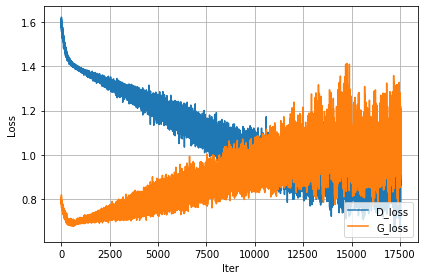

Epoch: [502] [  30/  35] D_loss: 0.80011874, G_loss: 1.11449206
Epoch: [502] completed	 D_loss: 0.89063239, G_loss: 0.91315848
Epoch: [503] [  30/  35] D_loss: 0.81494600, G_loss: 1.39646196
Epoch: [503] completed	 D_loss: 0.78660178, G_loss: 1.16610074
Epoch: [504] [  30/  35] D_loss: 0.71616411, G_loss: 1.21358240
Epoch: [504] completed	 D_loss: 0.88868725, G_loss: 1.12238216
Epoch: [505] [  30/  35] D_loss: 0.81505215, G_loss: 1.04972684
Epoch: [505] completed	 D_loss: 0.81330824, G_loss: 0.98159951
Epoch: [506] [  30/  35] D_loss: 0.90898454, G_loss: 0.96538860
Epoch: [506] completed	 D_loss: 0.95259941, G_loss: 0.91717058
Epoch: [507] [  30/  35] D_loss: 0.87799960, G_loss: 1.03833795
Epoch: [507] completed	 D_loss: 0.87415916, G_loss: 1.02661371
Epoch: [508] [  30/  35] D_loss: 0.81571364, G_loss: 0.97148532
Epoch: [508] completed	 D_loss: 0.97691572, G_loss: 1.06140566
Epoch: [509] [  30/  35] D_loss: 1.07124496, G_loss: 1.16446459
Epoch: [509] completed	 D_loss: 0.96115410, G_l

Epoch: [567] [  30/  35] D_loss: 0.77345437, G_loss: 0.98343909
Epoch: [567] completed	 D_loss: 1.15851855, G_loss: 0.86803895
Epoch: [568] [  30/  35] D_loss: 0.78787065, G_loss: 1.05718207
Epoch: [568] completed	 D_loss: 0.83881271, G_loss: 1.06911135
Epoch: [569] [  30/  35] D_loss: 0.95725489, G_loss: 1.01234508
Epoch: [569] completed	 D_loss: 1.00065470, G_loss: 0.87303859
Epoch: [570] [  30/  35] D_loss: 1.06198347, G_loss: 1.15087271
Epoch: [570] completed	 D_loss: 0.86350942, G_loss: 1.04113662
Epoch: [571] [  30/  35] D_loss: 0.75972831, G_loss: 1.06343055
Epoch: [571] completed	 D_loss: 0.97826105, G_loss: 0.96520030
Epoch: [572] [  30/  35] D_loss: 1.02860522, G_loss: 0.94539165
Epoch: [572] completed	 D_loss: 0.84606075, G_loss: 1.03153515
Epoch: [573] [  30/  35] D_loss: 0.94234347, G_loss: 1.16260135
Epoch: [573] completed	 D_loss: 0.93894839, G_loss: 0.92843503
Epoch: [574] [  30/  35] D_loss: 0.92453837, G_loss: 0.96962750
Epoch: [574] completed	 D_loss: 0.85305911, G_l

Epoch: [602] [  30/  35] D_loss: 0.95174098, G_loss: 1.06047356
Epoch: [602] completed	 D_loss: 1.16815758, G_loss: 0.91280961
Epoch: [603] [  30/  35] D_loss: 0.98351681, G_loss: 0.98946297
Epoch: [603] completed	 D_loss: 1.03867674, G_loss: 1.06646478
Epoch: [604] [  30/  35] D_loss: 0.89256865, G_loss: 1.01701188
Epoch: [604] completed	 D_loss: 0.93163764, G_loss: 0.94770992
Epoch: [605] [  30/  35] D_loss: 1.03042006, G_loss: 0.94341362
Epoch: [605] completed	 D_loss: 0.99646419, G_loss: 0.91803622
Epoch: [606] [  30/  35] D_loss: 1.04597223, G_loss: 1.07299232
Epoch: [606] completed	 D_loss: 0.89941984, G_loss: 1.01015079
Epoch: [607] [  30/  35] D_loss: 0.85966790, G_loss: 0.94896424
Epoch: [607] completed	 D_loss: 0.93694192, G_loss: 0.96510297
Epoch: [608] [  30/  35] D_loss: 0.95823848, G_loss: 0.95185798
Epoch: [608] completed	 D_loss: 0.94653094, G_loss: 0.88219738
Epoch: [609] [  30/  35] D_loss: 0.95635831, G_loss: 1.10444963
Epoch: [609] completed	 D_loss: 0.86357319, G_l

Epoch: [667] [  30/  35] D_loss: 0.87988555, G_loss: 1.04089463
Epoch: [667] completed	 D_loss: 1.07723570, G_loss: 0.91267341
Epoch: [668] [  30/  35] D_loss: 1.19147325, G_loss: 0.86597234
Epoch: [668] completed	 D_loss: 1.08888316, G_loss: 0.88557214
Epoch: [669] [  30/  35] D_loss: 0.90987480, G_loss: 1.02738404
Epoch: [669] completed	 D_loss: 0.87516391, G_loss: 0.93067908
Epoch: [670] [  30/  35] D_loss: 1.09762144, G_loss: 1.13908136
Epoch: [670] completed	 D_loss: 1.02030098, G_loss: 1.15016007
Epoch: [671] [  30/  35] D_loss: 0.93780553, G_loss: 0.88117599
Epoch: [671] completed	 D_loss: 1.12940907, G_loss: 0.92105502
Epoch: [672] [  30/  35] D_loss: 1.04722881, G_loss: 0.90469688
Epoch: [672] completed	 D_loss: 0.91108918, G_loss: 0.88749403
Epoch: [673] [  30/  35] D_loss: 1.13114238, G_loss: 0.95688677
Epoch: [673] completed	 D_loss: 1.03211451, G_loss: 0.93559265
Epoch: [674] [  30/  35] D_loss: 0.89243758, G_loss: 1.04226494
Epoch: [674] completed	 D_loss: 1.08914900, G_l

Epoch: [702] [  30/  35] D_loss: 0.97276634, G_loss: 0.85743183
Epoch: [702] completed	 D_loss: 0.94645262, G_loss: 1.04422224
Epoch: [703] [  30/  35] D_loss: 1.19960666, G_loss: 0.95141304
Epoch: [703] completed	 D_loss: 0.99414164, G_loss: 0.84238923
Epoch: [704] [  30/  35] D_loss: 1.00553381, G_loss: 0.99325001
Epoch: [704] completed	 D_loss: 0.94876409, G_loss: 1.07517600
Epoch: [705] [  30/  35] D_loss: 1.15627050, G_loss: 0.74956012
Epoch: [705] completed	 D_loss: 0.92332631, G_loss: 0.93072414
Epoch: [706] [  30/  35] D_loss: 0.92595130, G_loss: 0.87970614
Epoch: [706] completed	 D_loss: 1.11119819, G_loss: 0.90762740
Epoch: [707] [  30/  35] D_loss: 0.88635993, G_loss: 1.09008908
Epoch: [707] completed	 D_loss: 1.06105125, G_loss: 0.80607224
Epoch: [708] [  30/  35] D_loss: 1.08236682, G_loss: 0.99683785
Epoch: [708] completed	 D_loss: 0.88820320, G_loss: 1.15908301
Epoch: [709] [  30/  35] D_loss: 1.14549804, G_loss: 1.08503115
Epoch: [709] completed	 D_loss: 1.00838923, G_l

Epoch: [767] [  30/  35] D_loss: 1.08744621, G_loss: 0.87655002
Epoch: [767] completed	 D_loss: 1.19147015, G_loss: 0.92330539
Epoch: [768] [  30/  35] D_loss: 1.03367269, G_loss: 0.95975554
Epoch: [768] completed	 D_loss: 0.97057539, G_loss: 1.01405954
Epoch: [769] [  30/  35] D_loss: 1.02606916, G_loss: 0.89304513
Epoch: [769] completed	 D_loss: 1.02024603, G_loss: 0.98941517
Epoch: [770] [  30/  35] D_loss: 1.16623092, G_loss: 0.89419049
Epoch: [770] completed	 D_loss: 1.12710369, G_loss: 1.10106814
Epoch: [771] [  30/  35] D_loss: 0.97655469, G_loss: 0.86518705
Epoch: [771] completed	 D_loss: 1.09132218, G_loss: 0.87881964
Epoch: [772] [  30/  35] D_loss: 1.04022789, G_loss: 0.82398248
Epoch: [772] completed	 D_loss: 1.13553679, G_loss: 1.08119023
Epoch: [773] [  30/  35] D_loss: 1.21382976, G_loss: 0.84478855
Epoch: [773] completed	 D_loss: 1.14377117, G_loss: 0.82599932
Epoch: [774] [  30/  35] D_loss: 1.06487226, G_loss: 0.92363697
Epoch: [774] completed	 D_loss: 1.17979002, G_l

Epoch: [802] [  30/  35] D_loss: 0.98416495, G_loss: 0.85775828
Epoch: [802] completed	 D_loss: 0.96617401, G_loss: 0.88623577
Epoch: [803] [  30/  35] D_loss: 1.08477855, G_loss: 0.84031421
Epoch: [803] completed	 D_loss: 1.18388534, G_loss: 0.93738961
Epoch: [804] [  30/  35] D_loss: 1.08407545, G_loss: 0.90094262
Epoch: [804] completed	 D_loss: 1.03861916, G_loss: 0.92543465
Epoch: [805] [  30/  35] D_loss: 0.97551179, G_loss: 1.01455116
Epoch: [805] completed	 D_loss: 1.13602328, G_loss: 0.96491033
Epoch: [806] [  30/  35] D_loss: 0.89650720, G_loss: 1.01899314
Epoch: [806] completed	 D_loss: 1.30189443, G_loss: 0.90278935
Epoch: [807] [  30/  35] D_loss: 1.16600084, G_loss: 0.87285948
Epoch: [807] completed	 D_loss: 1.02865314, G_loss: 0.76016349
Epoch: [808] [  30/  35] D_loss: 1.10701799, G_loss: 0.82782793
Epoch: [808] completed	 D_loss: 1.04066551, G_loss: 1.04452550
Epoch: [809] [  30/  35] D_loss: 1.00398517, G_loss: 0.94909507
Epoch: [809] completed	 D_loss: 1.35188591, G_l

Epoch: [867] [  30/  35] D_loss: 1.13533640, G_loss: 0.81452274
Epoch: [867] completed	 D_loss: 1.02298701, G_loss: 0.88054115
Epoch: [868] [  30/  35] D_loss: 1.10320640, G_loss: 0.97914398
Epoch: [868] completed	 D_loss: 1.18319261, G_loss: 0.70750272
Epoch: [869] [  30/  35] D_loss: 1.09089446, G_loss: 0.83817106
Epoch: [869] completed	 D_loss: 0.92491668, G_loss: 0.82807028
Epoch: [870] [  30/  35] D_loss: 1.26018405, G_loss: 0.81800222
Epoch: [870] completed	 D_loss: 1.08049786, G_loss: 0.84006894
Epoch: [871] [  30/  35] D_loss: 1.33904266, G_loss: 0.97255278
Epoch: [871] completed	 D_loss: 1.07070243, G_loss: 0.82789129
Epoch: [872] [  30/  35] D_loss: 1.08414769, G_loss: 0.77186060
Epoch: [872] completed	 D_loss: 1.37685072, G_loss: 0.89282864
Epoch: [873] [  30/  35] D_loss: 1.21400535, G_loss: 0.90972239
Epoch: [873] completed	 D_loss: 1.21906686, G_loss: 0.81719238
Epoch: [874] [  30/  35] D_loss: 1.01585889, G_loss: 0.88369060
Epoch: [874] completed	 D_loss: 1.28361964, G_l

Epoch: [902] [  30/  35] D_loss: 1.24582875, G_loss: 1.01312709
Epoch: [902] completed	 D_loss: 1.15325665, G_loss: 0.78120732
Epoch: [903] [  30/  35] D_loss: 1.16767621, G_loss: 0.86533189
Epoch: [903] completed	 D_loss: 1.24573910, G_loss: 0.91568911
Epoch: [904] [  30/  35] D_loss: 1.10284019, G_loss: 0.84593797
Epoch: [904] completed	 D_loss: 1.21822548, G_loss: 0.81828195
Epoch: [905] [  30/  35] D_loss: 1.20382667, G_loss: 0.77342081
Epoch: [905] completed	 D_loss: 1.15514374, G_loss: 1.03565800
Epoch: [906] [  30/  35] D_loss: 0.93733889, G_loss: 0.84666234
Epoch: [906] completed	 D_loss: 1.29367566, G_loss: 1.11670411
Epoch: [907] [  30/  35] D_loss: 1.23870969, G_loss: 0.98886859
Epoch: [907] completed	 D_loss: 1.14521694, G_loss: 0.90539616
Epoch: [908] [  30/  35] D_loss: 1.13897943, G_loss: 0.81043816
Epoch: [908] completed	 D_loss: 1.13871813, G_loss: 0.86916578
Epoch: [909] [  30/  35] D_loss: 1.01254034, G_loss: 0.67405891
Epoch: [909] completed	 D_loss: 1.03030622, G_l

Epoch: [967] [  30/  35] D_loss: 1.17486572, G_loss: 0.85259300
Epoch: [967] completed	 D_loss: 1.10004711, G_loss: 0.94125557
Epoch: [968] [  30/  35] D_loss: 1.27795541, G_loss: 0.59351993
Epoch: [968] completed	 D_loss: 1.31013918, G_loss: 0.63499737
Epoch: [969] [  30/  35] D_loss: 1.46704507, G_loss: 0.64842200
Epoch: [969] completed	 D_loss: 1.30508876, G_loss: 0.73121816
Epoch: [970] [  30/  35] D_loss: 1.33216202, G_loss: 0.63937968
Epoch: [970] completed	 D_loss: 1.49236453, G_loss: 0.57101238
Epoch: [971] [  30/  35] D_loss: 1.14255762, G_loss: 0.61342812
Epoch: [971] completed	 D_loss: 1.50244355, G_loss: 0.70258558
Epoch: [972] [  30/  35] D_loss: 1.19028497, G_loss: 0.63691545
Epoch: [972] completed	 D_loss: 1.24022019, G_loss: 0.70977014
Epoch: [973] [  30/  35] D_loss: 1.30612409, G_loss: 0.79326493
Epoch: [973] completed	 D_loss: 1.33859479, G_loss: 0.82908785
Epoch: [974] [  30/  35] D_loss: 0.98185182, G_loss: 0.68187350
Epoch: [974] completed	 D_loss: 1.21063137, G_l

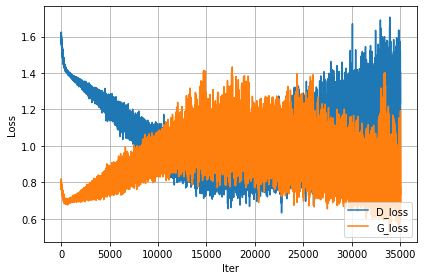

Epoch: [1002] [  30/  35] D_loss: 1.41141963, G_loss: 0.78167385
Epoch: [1002] completed	 D_loss: 1.28759181, G_loss: 0.65502274
Epoch: [1003] [  30/  35] D_loss: 1.03487897, G_loss: 0.82490557
Epoch: [1003] completed	 D_loss: 1.31975675, G_loss: 0.90547389
Epoch: [1004] [  30/  35] D_loss: 1.18582857, G_loss: 0.76961017
Epoch: [1004] completed	 D_loss: 1.30463839, G_loss: 0.73244011
Epoch: [1005] [  30/  35] D_loss: 1.24746251, G_loss: 0.77044231
Epoch: [1005] completed	 D_loss: 1.19285011, G_loss: 0.80210996
Epoch: [1006] [  30/  35] D_loss: 1.20112169, G_loss: 0.65804505
Epoch: [1006] completed	 D_loss: 1.35078716, G_loss: 0.69927388
Epoch: [1007] [  30/  35] D_loss: 1.20819676, G_loss: 0.67228550
Epoch: [1007] completed	 D_loss: 1.17219353, G_loss: 0.80669320
Epoch: [1008] [  30/  35] D_loss: 1.29412365, G_loss: 0.73117888
Epoch: [1008] completed	 D_loss: 1.04572654, G_loss: 0.71763021
Epoch: [1009] [  30/  35] D_loss: 1.42322099, G_loss: 0.94239080
Epoch: [1009] completed	 D_loss:

Epoch: [1066] [  30/  35] D_loss: 1.43087387, G_loss: 0.62117392
Epoch: [1066] completed	 D_loss: 1.29382336, G_loss: 0.76545054
Epoch: [1067] [  30/  35] D_loss: 1.34390092, G_loss: 0.91103137
Epoch: [1067] completed	 D_loss: 1.22384250, G_loss: 1.09698868
Epoch: [1068] [  30/  35] D_loss: 1.21001923, G_loss: 1.06798351
Epoch: [1068] completed	 D_loss: 1.37371039, G_loss: 0.68687218
Epoch: [1069] [  30/  35] D_loss: 1.18943250, G_loss: 0.76990831
Epoch: [1069] completed	 D_loss: 1.30193281, G_loss: 0.72425812
Epoch: [1070] [  30/  35] D_loss: 1.23168600, G_loss: 0.67712182
Epoch: [1070] completed	 D_loss: 1.35440969, G_loss: 0.69071490
Epoch: [1071] [  30/  35] D_loss: 1.14569521, G_loss: 0.68543780
Epoch: [1071] completed	 D_loss: 1.35293508, G_loss: 0.71239406
Epoch: [1072] [  30/  35] D_loss: 1.14494562, G_loss: 0.68717378
Epoch: [1072] completed	 D_loss: 1.14973068, G_loss: 0.97001266
Epoch: [1073] [  30/  35] D_loss: 1.23605752, G_loss: 0.66978937
Epoch: [1073] completed	 D_loss:

Epoch: [1102] [  30/  35] D_loss: 1.27414799, G_loss: 0.64091498
Epoch: [1102] completed	 D_loss: 1.36263406, G_loss: 0.68376678
Epoch: [1103] [  30/  35] D_loss: 1.27321243, G_loss: 0.68215191
Epoch: [1103] completed	 D_loss: 1.20527124, G_loss: 0.63324416
Epoch: [1104] [  30/  35] D_loss: 1.35593200, G_loss: 0.67340374
Epoch: [1104] completed	 D_loss: 1.33632135, G_loss: 0.77516097
Epoch: [1105] [  30/  35] D_loss: 1.12706208, G_loss: 0.74641305
Epoch: [1105] completed	 D_loss: 1.15451145, G_loss: 0.70203751
Epoch: [1106] [  30/  35] D_loss: 1.20910645, G_loss: 0.78030849
Epoch: [1106] completed	 D_loss: 1.09893644, G_loss: 0.76671499
Epoch: [1107] [  30/  35] D_loss: 1.22890520, G_loss: 0.82784045
Epoch: [1107] completed	 D_loss: 1.33379817, G_loss: 0.57460678
Epoch: [1108] [  30/  35] D_loss: 1.58545327, G_loss: 0.80559337
Epoch: [1108] completed	 D_loss: 1.18743372, G_loss: 0.86528838
Epoch: [1109] [  30/  35] D_loss: 1.45342529, G_loss: 0.87763792
Epoch: [1109] completed	 D_loss:

Epoch: [1166] [  30/  35] D_loss: 1.28120446, G_loss: 0.82409096
Epoch: [1166] completed	 D_loss: 1.33131933, G_loss: 0.70068133
Epoch: [1167] [  30/  35] D_loss: 1.34465528, G_loss: 0.71988809
Epoch: [1167] completed	 D_loss: 1.29628491, G_loss: 0.74371672
Epoch: [1168] [  30/  35] D_loss: 1.47592092, G_loss: 0.67214739
Epoch: [1168] completed	 D_loss: 1.33949828, G_loss: 0.74790841
Epoch: [1169] [  30/  35] D_loss: 1.22948694, G_loss: 0.65658164
Epoch: [1169] completed	 D_loss: 1.17355955, G_loss: 0.67595220
Epoch: [1170] [  30/  35] D_loss: 1.33584404, G_loss: 0.66567725
Epoch: [1170] completed	 D_loss: 1.47517681, G_loss: 0.62647414
Epoch: [1171] [  30/  35] D_loss: 1.44147408, G_loss: 0.60756838
Epoch: [1171] completed	 D_loss: 1.63345885, G_loss: 0.62544101
Epoch: [1172] [  30/  35] D_loss: 1.37178206, G_loss: 0.66925186
Epoch: [1172] completed	 D_loss: 1.38851869, G_loss: 0.76898372
Epoch: [1173] [  30/  35] D_loss: 1.23009288, G_loss: 0.61365843
Epoch: [1173] completed	 D_loss:

Epoch: [1202] [  30/  35] D_loss: 1.54472399, G_loss: 0.70934480
Epoch: [1202] completed	 D_loss: 1.44358730, G_loss: 0.60611117
Epoch: [1203] [  30/  35] D_loss: 1.32931674, G_loss: 0.77047294
Epoch: [1203] completed	 D_loss: 1.33347142, G_loss: 0.62451237
Epoch: [1204] [  30/  35] D_loss: 1.40374434, G_loss: 0.64034694
Epoch: [1204] completed	 D_loss: 1.32664406, G_loss: 0.64905208
Epoch: [1205] [  30/  35] D_loss: 1.54351640, G_loss: 0.74416739
Epoch: [1205] completed	 D_loss: 1.54225099, G_loss: 0.61476970
Epoch: [1206] [  30/  35] D_loss: 1.31944144, G_loss: 0.69533205
Epoch: [1206] completed	 D_loss: 1.46119690, G_loss: 0.74836636
Epoch: [1207] [  30/  35] D_loss: 1.41652024, G_loss: 0.68593699
Epoch: [1207] completed	 D_loss: 1.33125043, G_loss: 0.61199558
Epoch: [1208] [  30/  35] D_loss: 1.23005199, G_loss: 0.76541650
Epoch: [1208] completed	 D_loss: 1.60755634, G_loss: 0.62727737
Epoch: [1209] [  30/  35] D_loss: 1.41100109, G_loss: 0.59112382
Epoch: [1209] completed	 D_loss:

Epoch: [1266] [  30/  35] D_loss: 1.45161068, G_loss: 0.61588824
Epoch: [1266] completed	 D_loss: 1.51030755, G_loss: 0.69219393
Epoch: [1267] [  30/  35] D_loss: 1.41929626, G_loss: 0.57374007
Epoch: [1267] completed	 D_loss: 1.29790592, G_loss: 0.61386412
Epoch: [1268] [  30/  35] D_loss: 1.42112052, G_loss: 0.62058151
Epoch: [1268] completed	 D_loss: 1.49649894, G_loss: 0.58369398
Epoch: [1269] [  30/  35] D_loss: 1.49702847, G_loss: 0.65449804
Epoch: [1269] completed	 D_loss: 1.44346464, G_loss: 0.68237281
Epoch: [1270] [  30/  35] D_loss: 1.46316159, G_loss: 0.67344725
Epoch: [1270] completed	 D_loss: 1.09991133, G_loss: 0.71777332
Epoch: [1271] [  30/  35] D_loss: 1.16580224, G_loss: 0.66006267
Epoch: [1271] completed	 D_loss: 1.59046388, G_loss: 0.61462283
Epoch: [1272] [  30/  35] D_loss: 1.47081637, G_loss: 0.61441123
Epoch: [1272] completed	 D_loss: 1.38010693, G_loss: 0.57094187
Epoch: [1273] [  30/  35] D_loss: 1.31073952, G_loss: 0.66332287
Epoch: [1273] completed	 D_loss:

Epoch: [1302] [  30/  35] D_loss: 1.30637121, G_loss: 0.65632635
Epoch: [1302] completed	 D_loss: 1.23796535, G_loss: 0.61275613
Epoch: [1303] [  30/  35] D_loss: 1.51078463, G_loss: 0.66570526
Epoch: [1303] completed	 D_loss: 1.53734231, G_loss: 0.62987351
Epoch: [1304] [  30/  35] D_loss: 1.47750235, G_loss: 0.59871805
Epoch: [1304] completed	 D_loss: 1.32932568, G_loss: 0.78334045
Epoch: [1305] [  30/  35] D_loss: 1.55538964, G_loss: 0.64953142
Epoch: [1305] completed	 D_loss: 1.58871889, G_loss: 0.67556375
Epoch: [1306] [  30/  35] D_loss: 1.61296165, G_loss: 0.64063168
Epoch: [1306] completed	 D_loss: 1.29674506, G_loss: 0.69707727
Epoch: [1307] [  30/  35] D_loss: 1.45914388, G_loss: 0.65645772
Epoch: [1307] completed	 D_loss: 1.40778768, G_loss: 0.64299083
Epoch: [1308] [  30/  35] D_loss: 1.37500691, G_loss: 0.68285429
Epoch: [1308] completed	 D_loss: 1.25844812, G_loss: 0.73392391
Epoch: [1309] [  30/  35] D_loss: 1.19644558, G_loss: 0.91408992
Epoch: [1309] completed	 D_loss:

Epoch: [1366] [  30/  35] D_loss: 1.54226100, G_loss: 0.63360786
Epoch: [1366] completed	 D_loss: 1.46998191, G_loss: 0.60233545
Epoch: [1367] [  30/  35] D_loss: 1.50357556, G_loss: 0.59712797
Epoch: [1367] completed	 D_loss: 1.43046391, G_loss: 0.57574111
Epoch: [1368] [  30/  35] D_loss: 1.53592050, G_loss: 0.56987536
Epoch: [1368] completed	 D_loss: 1.30248451, G_loss: 0.65727597
Epoch: [1369] [  30/  35] D_loss: 1.63980329, G_loss: 0.59880286
Epoch: [1369] completed	 D_loss: 1.52096868, G_loss: 0.59502864
Epoch: [1370] [  30/  35] D_loss: 1.46944904, G_loss: 0.63970369
Epoch: [1370] completed	 D_loss: 1.53601813, G_loss: 0.61807323
Epoch: [1371] [  30/  35] D_loss: 1.47551584, G_loss: 0.62234271
Epoch: [1371] completed	 D_loss: 1.48176432, G_loss: 0.59527558
Epoch: [1372] [  30/  35] D_loss: 1.35549641, G_loss: 0.64515024
Epoch: [1372] completed	 D_loss: 1.43146300, G_loss: 0.59510708
Epoch: [1373] [  30/  35] D_loss: 1.26524031, G_loss: 0.64028978
Epoch: [1373] completed	 D_loss:

Epoch: [1402] [  30/  35] D_loss: 1.52091336, G_loss: 0.61794615
Epoch: [1402] completed	 D_loss: 1.54790843, G_loss: 0.66831905
Epoch: [1403] [  30/  35] D_loss: 1.45493221, G_loss: 0.64744103
Epoch: [1403] completed	 D_loss: 1.50713778, G_loss: 0.67499566
Epoch: [1404] [  30/  35] D_loss: 1.40052199, G_loss: 0.63167024
Epoch: [1404] completed	 D_loss: 1.42954612, G_loss: 0.58944666
Epoch: [1405] [  30/  35] D_loss: 1.54552650, G_loss: 0.60855615
Epoch: [1405] completed	 D_loss: 1.41057181, G_loss: 0.60053778
Epoch: [1406] [  30/  35] D_loss: 1.42756128, G_loss: 0.63380021
Epoch: [1406] completed	 D_loss: 1.37227988, G_loss: 0.60942930
Epoch: [1407] [  30/  35] D_loss: 1.46428335, G_loss: 0.64034086
Epoch: [1407] completed	 D_loss: 1.53182936, G_loss: 0.59213752
Epoch: [1408] [  30/  35] D_loss: 1.56819677, G_loss: 0.62677312
Epoch: [1408] completed	 D_loss: 1.58898878, G_loss: 0.62120599
Epoch: [1409] [  30/  35] D_loss: 1.57695961, G_loss: 0.62601179
Epoch: [1409] completed	 D_loss:

Epoch: [1466] [  30/  35] D_loss: 1.41744280, G_loss: 0.60921746
Epoch: [1466] completed	 D_loss: 1.32458532, G_loss: 0.63846833
Epoch: [1467] [  30/  35] D_loss: 1.48760641, G_loss: 0.63326317
Epoch: [1467] completed	 D_loss: 1.48689306, G_loss: 0.64513272
Epoch: [1468] [  30/  35] D_loss: 1.54371738, G_loss: 0.66579992
Epoch: [1468] completed	 D_loss: 1.43539941, G_loss: 0.61352104
Epoch: [1469] [  30/  35] D_loss: 1.51302993, G_loss: 0.62189049
Epoch: [1469] completed	 D_loss: 1.47588825, G_loss: 0.61594063
Epoch: [1470] [  30/  35] D_loss: 1.48620749, G_loss: 0.62651992
Epoch: [1470] completed	 D_loss: 1.55102074, G_loss: 0.61537963
Epoch: [1471] [  30/  35] D_loss: 1.54032123, G_loss: 0.63400650
Epoch: [1471] completed	 D_loss: 1.54272652, G_loss: 0.61985886
Epoch: [1472] [  30/  35] D_loss: 1.50603080, G_loss: 0.62236714
Epoch: [1472] completed	 D_loss: 1.41048408, G_loss: 0.62622261
Epoch: [1473] [  30/  35] D_loss: 1.56708241, G_loss: 0.62595528
Epoch: [1473] completed	 D_loss:

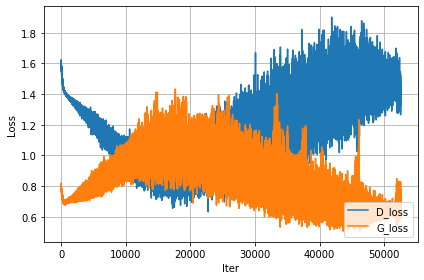

Epoch: [1502] [  30/  35] D_loss: 1.39780760, G_loss: 0.59418011
Epoch: [1502] completed	 D_loss: 1.34567881, G_loss: 0.60800332
Epoch: [1503] [  30/  35] D_loss: 1.43268359, G_loss: 0.63828218
Epoch: [1503] completed	 D_loss: 1.46055841, G_loss: 0.61906618
Epoch: [1504] [  30/  35] D_loss: 1.52945447, G_loss: 0.61216688
Epoch: [1504] completed	 D_loss: 1.36220717, G_loss: 0.75657851
Epoch: [1505] [  30/  35] D_loss: 1.35466659, G_loss: 0.63786286
Epoch: [1505] completed	 D_loss: 1.40834868, G_loss: 0.67214876
Epoch: [1506] [  30/  35] D_loss: 1.44741714, G_loss: 0.64180052
Epoch: [1506] completed	 D_loss: 1.33722389, G_loss: 0.68867517
Epoch: [1507] [  30/  35] D_loss: 1.47421575, G_loss: 0.61407536
Epoch: [1507] completed	 D_loss: 1.46434093, G_loss: 0.63849211
Epoch: [1508] [  30/  35] D_loss: 1.32519090, G_loss: 0.71179962
Epoch: [1508] completed	 D_loss: 1.40762210, G_loss: 0.64147133
Epoch: [1509] [  30/  35] D_loss: 1.30851018, G_loss: 0.65080988
Epoch: [1509] completed	 D_loss:

Epoch: [1566] [  30/  35] D_loss: 1.45485926, G_loss: 0.65459305
Epoch: [1566] completed	 D_loss: 1.41846216, G_loss: 0.63798529
Epoch: [1567] [  30/  35] D_loss: 1.38837910, G_loss: 0.65986949
Epoch: [1567] completed	 D_loss: 1.43399715, G_loss: 0.64356750
Epoch: [1568] [  30/  35] D_loss: 1.44660068, G_loss: 0.63173389
Epoch: [1568] completed	 D_loss: 1.45491159, G_loss: 0.65499806
Epoch: [1569] [  30/  35] D_loss: 1.45577061, G_loss: 0.65601242
Epoch: [1569] completed	 D_loss: 1.45435262, G_loss: 0.65054041
Epoch: [1570] [  30/  35] D_loss: 1.44861794, G_loss: 0.64842463
Epoch: [1570] completed	 D_loss: 1.46415651, G_loss: 0.65615392
Epoch: [1571] [  30/  35] D_loss: 1.44127011, G_loss: 0.69034559
Epoch: [1571] completed	 D_loss: 1.48164701, G_loss: 0.66057670
Epoch: [1572] [  30/  35] D_loss: 1.45472872, G_loss: 0.63286185
Epoch: [1572] completed	 D_loss: 1.44936264, G_loss: 0.64705151
Epoch: [1573] [  30/  35] D_loss: 1.43632579, G_loss: 0.66740483
Epoch: [1573] completed	 D_loss:

Epoch: [1602] [  30/  35] D_loss: 1.40789771, G_loss: 0.66725594
Epoch: [1602] completed	 D_loss: 1.40763330, G_loss: 0.66456282
Epoch: [1603] [  30/  35] D_loss: 1.40340686, G_loss: 0.68216860
Epoch: [1603] completed	 D_loss: 1.42102635, G_loss: 0.69138730
Epoch: [1604] [  30/  35] D_loss: 1.41365838, G_loss: 0.63590688
Epoch: [1604] completed	 D_loss: 1.40812993, G_loss: 0.63423806
Epoch: [1605] [  30/  35] D_loss: 1.41187882, G_loss: 0.69039416
Epoch: [1605] completed	 D_loss: 1.41517591, G_loss: 0.68482894
Epoch: [1606] [  30/  35] D_loss: 1.42759717, G_loss: 0.61992371
Epoch: [1606] completed	 D_loss: 1.42379653, G_loss: 0.65280569
Epoch: [1607] [  30/  35] D_loss: 1.42183697, G_loss: 0.66129768
Epoch: [1607] completed	 D_loss: 1.39452899, G_loss: 0.65696579
Epoch: [1608] [  30/  35] D_loss: 1.43359923, G_loss: 0.65922260
Epoch: [1608] completed	 D_loss: 1.40913844, G_loss: 0.68173623
Epoch: [1609] [  30/  35] D_loss: 1.41691697, G_loss: 0.63892764
Epoch: [1609] completed	 D_loss:

Epoch: [1666] [  30/  35] D_loss: 1.43413854, G_loss: 0.60966539
Epoch: [1666] completed	 D_loss: 1.44248509, G_loss: 0.62634516
Epoch: [1667] [  30/  35] D_loss: 1.42145348, G_loss: 0.64681476
Epoch: [1667] completed	 D_loss: 1.43421912, G_loss: 0.67254925
Epoch: [1668] [  30/  35] D_loss: 1.41354322, G_loss: 0.68580073
Epoch: [1668] completed	 D_loss: 1.43255460, G_loss: 0.63857275
Epoch: [1669] [  30/  35] D_loss: 1.43398905, G_loss: 0.65602183
Epoch: [1669] completed	 D_loss: 1.44326282, G_loss: 0.72354543
Epoch: [1670] [  30/  35] D_loss: 1.41227961, G_loss: 0.63109851
Epoch: [1670] completed	 D_loss: 1.41191971, G_loss: 0.67603219
Epoch: [1671] [  30/  35] D_loss: 1.42997670, G_loss: 0.69425321
Epoch: [1671] completed	 D_loss: 1.41773629, G_loss: 0.66500163
Epoch: [1672] [  30/  35] D_loss: 1.42099321, G_loss: 0.69489491
Epoch: [1672] completed	 D_loss: 1.42567301, G_loss: 0.65403289
Epoch: [1673] [  30/  35] D_loss: 1.41747928, G_loss: 0.68668509
Epoch: [1673] completed	 D_loss:

Epoch: [1702] [  30/  35] D_loss: 1.42369390, G_loss: 0.75388896
Epoch: [1702] completed	 D_loss: 1.41871309, G_loss: 0.70076096
Epoch: [1703] [  30/  35] D_loss: 1.38517904, G_loss: 0.72603321
Epoch: [1703] completed	 D_loss: 1.39444900, G_loss: 0.66190642
Epoch: [1704] [  30/  35] D_loss: 1.40254617, G_loss: 0.74240142
Epoch: [1704] completed	 D_loss: 1.43227530, G_loss: 0.64156455
Epoch: [1705] [  30/  35] D_loss: 1.41301382, G_loss: 0.67316496
Epoch: [1705] completed	 D_loss: 1.39200020, G_loss: 0.69113261
Epoch: [1706] [  30/  35] D_loss: 1.40275621, G_loss: 0.66837019
Epoch: [1706] completed	 D_loss: 1.39977300, G_loss: 0.64586800
Epoch: [1707] [  30/  35] D_loss: 1.40027416, G_loss: 0.66687983
Epoch: [1707] completed	 D_loss: 1.40556836, G_loss: 0.67225087
Epoch: [1708] [  30/  35] D_loss: 1.38383317, G_loss: 0.65366197
Epoch: [1708] completed	 D_loss: 1.40553236, G_loss: 0.66781461
Epoch: [1709] [  30/  35] D_loss: 1.39328134, G_loss: 0.70311469
Epoch: [1709] completed	 D_loss:

Epoch: [1766] [  30/  35] D_loss: 1.42362702, G_loss: 0.64855266
Epoch: [1766] completed	 D_loss: 1.42226768, G_loss: 0.63932848
Epoch: [1767] [  30/  35] D_loss: 1.43270922, G_loss: 0.67345095
Epoch: [1767] completed	 D_loss: 1.42387938, G_loss: 0.64529264
Epoch: [1768] [  30/  35] D_loss: 1.34700966, G_loss: 0.66877663
Epoch: [1768] completed	 D_loss: 1.42920744, G_loss: 0.66113359
Epoch: [1769] [  30/  35] D_loss: 1.41003704, G_loss: 0.69971061
Epoch: [1769] completed	 D_loss: 1.40665579, G_loss: 0.68222445
Epoch: [1770] [  30/  35] D_loss: 1.41184390, G_loss: 0.65193909
Epoch: [1770] completed	 D_loss: 1.38175201, G_loss: 0.68744755
Epoch: [1771] [  30/  35] D_loss: 1.40676785, G_loss: 0.65770513
Epoch: [1771] completed	 D_loss: 1.41423786, G_loss: 0.67499709
Epoch: [1772] [  30/  35] D_loss: 1.39154410, G_loss: 0.65873682
Epoch: [1772] completed	 D_loss: 1.40613389, G_loss: 0.67279565
Epoch: [1773] [  30/  35] D_loss: 1.39225328, G_loss: 0.64742017
Epoch: [1773] completed	 D_loss:

Epoch: [1802] [  30/  35] D_loss: 1.39654624, G_loss: 0.69638878
Epoch: [1802] completed	 D_loss: 1.38200712, G_loss: 0.69573706
Epoch: [1803] [  30/  35] D_loss: 1.38850379, G_loss: 0.66551226
Epoch: [1803] completed	 D_loss: 1.40035534, G_loss: 0.67600286
Epoch: [1804] [  30/  35] D_loss: 1.37002182, G_loss: 0.67011929
Epoch: [1804] completed	 D_loss: 1.39518332, G_loss: 0.66126466
Epoch: [1805] [  30/  35] D_loss: 1.37102234, G_loss: 0.71851313
Epoch: [1805] completed	 D_loss: 1.40831208, G_loss: 0.67800069
Epoch: [1806] [  30/  35] D_loss: 1.38558793, G_loss: 0.68630046
Epoch: [1806] completed	 D_loss: 1.38479614, G_loss: 0.68232930
Epoch: [1807] [  30/  35] D_loss: 1.39748383, G_loss: 0.69047648
Epoch: [1807] completed	 D_loss: 1.37347794, G_loss: 0.71533239
Epoch: [1808] [  30/  35] D_loss: 1.37788033, G_loss: 0.67207164
Epoch: [1808] completed	 D_loss: 1.37199759, G_loss: 0.68375468
Epoch: [1809] [  30/  35] D_loss: 1.41368914, G_loss: 0.68400723
Epoch: [1809] completed	 D_loss:

Epoch: [1866] [  30/  35] D_loss: 1.37841964, G_loss: 0.65755689
Epoch: [1866] completed	 D_loss: 1.39238119, G_loss: 0.65044367
Epoch: [1867] [  30/  35] D_loss: 1.39872634, G_loss: 0.68012792
Epoch: [1867] completed	 D_loss: 1.37725663, G_loss: 0.67751849
Epoch: [1868] [  30/  35] D_loss: 1.38543820, G_loss: 0.67367172
Epoch: [1868] completed	 D_loss: 1.39251804, G_loss: 0.67340147
Epoch: [1869] [  30/  35] D_loss: 1.38126612, G_loss: 0.66069883
Epoch: [1869] completed	 D_loss: 1.38942862, G_loss: 0.69879729
Epoch: [1870] [  30/  35] D_loss: 1.37530041, G_loss: 0.68210453
Epoch: [1870] completed	 D_loss: 1.39919591, G_loss: 0.66336203
Epoch: [1871] [  30/  35] D_loss: 1.38943982, G_loss: 0.65159208
Epoch: [1871] completed	 D_loss: 1.38066339, G_loss: 0.65982872
Epoch: [1872] [  30/  35] D_loss: 1.40455377, G_loss: 0.66801435
Epoch: [1872] completed	 D_loss: 1.37350070, G_loss: 0.66433746
Epoch: [1873] [  30/  35] D_loss: 1.36113620, G_loss: 0.68182379
Epoch: [1873] completed	 D_loss:

Epoch: [1902] [  30/  35] D_loss: 1.42219627, G_loss: 0.66643655
Epoch: [1902] completed	 D_loss: 1.38223124, G_loss: 0.64911282
Epoch: [1903] [  30/  35] D_loss: 1.37519097, G_loss: 0.70749825
Epoch: [1903] completed	 D_loss: 1.40293634, G_loss: 0.67428714
Epoch: [1904] [  30/  35] D_loss: 1.39804542, G_loss: 0.65077436
Epoch: [1904] completed	 D_loss: 1.38100457, G_loss: 0.72289920
Epoch: [1905] [  30/  35] D_loss: 1.38882303, G_loss: 0.66473651
Epoch: [1905] completed	 D_loss: 1.37127066, G_loss: 0.67619050
Epoch: [1906] [  30/  35] D_loss: 1.39340246, G_loss: 0.68312168
Epoch: [1906] completed	 D_loss: 1.40019917, G_loss: 0.69251293
Epoch: [1907] [  30/  35] D_loss: 1.38580453, G_loss: 0.67978245
Epoch: [1907] completed	 D_loss: 1.40393853, G_loss: 0.64798462
Epoch: [1908] [  30/  35] D_loss: 1.37893414, G_loss: 0.70976216
Epoch: [1908] completed	 D_loss: 1.38076305, G_loss: 0.67394888
Epoch: [1909] [  30/  35] D_loss: 1.39139807, G_loss: 0.66413045
Epoch: [1909] completed	 D_loss:

Epoch: [1966] [  30/  35] D_loss: 1.39160371, G_loss: 0.68850672
Epoch: [1966] completed	 D_loss: 1.39607954, G_loss: 0.67531753
Epoch: [1967] [  30/  35] D_loss: 1.37005830, G_loss: 0.66504633
Epoch: [1967] completed	 D_loss: 1.37549615, G_loss: 0.66648471
Epoch: [1968] [  30/  35] D_loss: 1.38212872, G_loss: 0.66253805
Epoch: [1968] completed	 D_loss: 1.38766551, G_loss: 0.68332547
Epoch: [1969] [  30/  35] D_loss: 1.38913214, G_loss: 0.68718988
Epoch: [1969] completed	 D_loss: 1.38703728, G_loss: 0.69496340
Epoch: [1970] [  30/  35] D_loss: 1.38174367, G_loss: 0.68878984
Epoch: [1970] completed	 D_loss: 1.38395047, G_loss: 0.67001545
Epoch: [1971] [  30/  35] D_loss: 1.39848864, G_loss: 0.66768503
Epoch: [1971] completed	 D_loss: 1.39720857, G_loss: 0.68393630
Epoch: [1972] [  30/  35] D_loss: 1.39333498, G_loss: 0.67071271
Epoch: [1972] completed	 D_loss: 1.39286470, G_loss: 0.69889623
Epoch: [1973] [  30/  35] D_loss: 1.40022230, G_loss: 0.70560092
Epoch: [1973] completed	 D_loss:

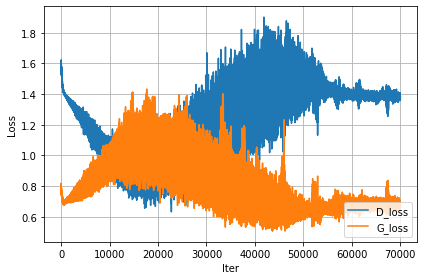

Epoch: [2002] [  30/  35] D_loss: 1.38796449, G_loss: 0.68361568
Epoch: [2002] completed	 D_loss: 1.37573075, G_loss: 0.67858183
Epoch: [2003] [  30/  35] D_loss: 1.37772775, G_loss: 0.67065370
Epoch: [2003] completed	 D_loss: 1.39243197, G_loss: 0.68187100
Epoch: [2004] [  30/  35] D_loss: 1.39398885, G_loss: 0.68270928
Epoch: [2004] completed	 D_loss: 1.37670422, G_loss: 0.67702973
Epoch: [2005] [  30/  35] D_loss: 1.37101650, G_loss: 0.72612965
Epoch: [2005] completed	 D_loss: 1.39325738, G_loss: 0.66252428
Epoch: [2006] [  30/  35] D_loss: 1.39346278, G_loss: 0.66492659
Epoch: [2006] completed	 D_loss: 1.40510416, G_loss: 0.67450511
Epoch: [2007] [  30/  35] D_loss: 1.41326618, G_loss: 0.68337023
Epoch: [2007] completed	 D_loss: 1.41138577, G_loss: 0.66243118
Epoch: [2008] [  30/  35] D_loss: 1.40244377, G_loss: 0.66488111
Epoch: [2008] completed	 D_loss: 1.40071297, G_loss: 0.67603838
Epoch: [2009] [  30/  35] D_loss: 1.38784587, G_loss: 0.66981876
Epoch: [2009] completed	 D_loss:

Epoch: [2066] [  30/  35] D_loss: 1.37264180, G_loss: 0.65802979
Epoch: [2066] completed	 D_loss: 1.37869573, G_loss: 0.68289971
Epoch: [2067] [  30/  35] D_loss: 1.38956141, G_loss: 0.67919683
Epoch: [2067] completed	 D_loss: 1.39826655, G_loss: 0.69181293
Epoch: [2068] [  30/  35] D_loss: 1.38603628, G_loss: 0.65439087
Epoch: [2068] completed	 D_loss: 1.39563608, G_loss: 0.70108557
Epoch: [2069] [  30/  35] D_loss: 1.39409041, G_loss: 0.65528131
Epoch: [2069] completed	 D_loss: 1.39126098, G_loss: 0.67791420
Epoch: [2070] [  30/  35] D_loss: 1.39436507, G_loss: 0.66895676
Epoch: [2070] completed	 D_loss: 1.39056218, G_loss: 0.66417927
Epoch: [2071] [  30/  35] D_loss: 1.37881196, G_loss: 0.69340581
Epoch: [2071] completed	 D_loss: 1.38060999, G_loss: 0.70012867
Epoch: [2072] [  30/  35] D_loss: 1.39866292, G_loss: 0.68050158
Epoch: [2072] completed	 D_loss: 1.38851476, G_loss: 0.67974293
Epoch: [2073] [  30/  35] D_loss: 1.39086831, G_loss: 0.65223551
Epoch: [2073] completed	 D_loss:

Epoch: [2102] [  30/  35] D_loss: 1.39786994, G_loss: 0.67206317
Epoch: [2102] completed	 D_loss: 1.34931755, G_loss: 0.73298717
Epoch: [2103] [  30/  35] D_loss: 1.36523128, G_loss: 0.68987191
Epoch: [2103] completed	 D_loss: 1.38266277, G_loss: 0.66134149
Epoch: [2104] [  30/  35] D_loss: 1.40812266, G_loss: 0.65158367
Epoch: [2104] completed	 D_loss: 1.42601299, G_loss: 0.68462175
Epoch: [2105] [  30/  35] D_loss: 1.30416656, G_loss: 0.72644240
Epoch: [2105] completed	 D_loss: 1.37238550, G_loss: 0.66104132
Epoch: [2106] [  30/  35] D_loss: 1.36466026, G_loss: 0.71783608
Epoch: [2106] completed	 D_loss: 1.38892961, G_loss: 0.69464767
Epoch: [2107] [  30/  35] D_loss: 1.43924940, G_loss: 0.63293964
Epoch: [2107] completed	 D_loss: 1.32619643, G_loss: 0.71071482
Epoch: [2108] [  30/  35] D_loss: 1.31325579, G_loss: 0.67650318
Epoch: [2108] completed	 D_loss: 1.39084888, G_loss: 0.64296687
Epoch: [2109] [  30/  35] D_loss: 1.42740238, G_loss: 0.61375332
Epoch: [2109] completed	 D_loss:

Epoch: [2166] [  30/  35] D_loss: 1.38347876, G_loss: 0.66923183
Epoch: [2166] completed	 D_loss: 1.38264561, G_loss: 0.67308271
Epoch: [2167] [  30/  35] D_loss: 1.39060688, G_loss: 0.66264886
Epoch: [2167] completed	 D_loss: 1.38495111, G_loss: 0.68926203
Epoch: [2168] [  30/  35] D_loss: 1.37672877, G_loss: 0.67303634
Epoch: [2168] completed	 D_loss: 1.39474487, G_loss: 0.69307011
Epoch: [2169] [  30/  35] D_loss: 1.38520837, G_loss: 0.69413513
Epoch: [2169] completed	 D_loss: 1.38130820, G_loss: 0.68893200
Epoch: [2170] [  30/  35] D_loss: 1.37729168, G_loss: 0.67655343
Epoch: [2170] completed	 D_loss: 1.37252402, G_loss: 0.69232178
Epoch: [2171] [  30/  35] D_loss: 1.38527298, G_loss: 0.67990470
Epoch: [2171] completed	 D_loss: 1.37289190, G_loss: 0.68666208
Epoch: [2172] [  30/  35] D_loss: 1.37006068, G_loss: 0.67900270
Epoch: [2172] completed	 D_loss: 1.38284135, G_loss: 0.68055588
Epoch: [2173] [  30/  35] D_loss: 1.38058150, G_loss: 0.67479658
Epoch: [2173] completed	 D_loss:

Epoch: [2202] [  30/  35] D_loss: 1.38564861, G_loss: 0.71757704
Epoch: [2202] completed	 D_loss: 1.38243258, G_loss: 0.69092190
Epoch: [2203] [  30/  35] D_loss: 1.38488531, G_loss: 0.69321579
Epoch: [2203] completed	 D_loss: 1.38354087, G_loss: 0.69547945
Epoch: [2204] [  30/  35] D_loss: 1.39159083, G_loss: 0.67368305
Epoch: [2204] completed	 D_loss: 1.36338162, G_loss: 0.69195092
Epoch: [2205] [  30/  35] D_loss: 1.37167001, G_loss: 0.70692962
Epoch: [2205] completed	 D_loss: 1.39430761, G_loss: 0.69334024
Epoch: [2206] [  30/  35] D_loss: 1.37784934, G_loss: 0.67564595
Epoch: [2206] completed	 D_loss: 1.39543104, G_loss: 0.68260616
Epoch: [2207] [  30/  35] D_loss: 1.37245822, G_loss: 0.68478787
Epoch: [2207] completed	 D_loss: 1.39189839, G_loss: 0.69346261
Epoch: [2208] [  30/  35] D_loss: 1.37392116, G_loss: 0.68463111
Epoch: [2208] completed	 D_loss: 1.36911392, G_loss: 0.68914747
Epoch: [2209] [  30/  35] D_loss: 1.38208055, G_loss: 0.67778337
Epoch: [2209] completed	 D_loss:

Epoch: [2266] [  30/  35] D_loss: 1.37429404, G_loss: 0.69651198
Epoch: [2266] completed	 D_loss: 1.38775444, G_loss: 0.70115775
Epoch: [2267] [  30/  35] D_loss: 1.37276208, G_loss: 0.69303775
Epoch: [2267] completed	 D_loss: 1.39806414, G_loss: 0.68795806
Epoch: [2268] [  30/  35] D_loss: 1.38586473, G_loss: 0.68242204
Epoch: [2268] completed	 D_loss: 1.38904476, G_loss: 0.67050201
Epoch: [2269] [  30/  35] D_loss: 1.39197898, G_loss: 0.66819358
Epoch: [2269] completed	 D_loss: 1.38725126, G_loss: 0.67286873
Epoch: [2270] [  30/  35] D_loss: 1.37915826, G_loss: 0.67378950
Epoch: [2270] completed	 D_loss: 1.39466548, G_loss: 0.68408614
Epoch: [2271] [  30/  35] D_loss: 1.38785255, G_loss: 0.66369218
Epoch: [2271] completed	 D_loss: 1.37681746, G_loss: 0.68231326
Epoch: [2272] [  30/  35] D_loss: 1.38392913, G_loss: 0.66714513
Epoch: [2272] completed	 D_loss: 1.38927126, G_loss: 0.68163097
Epoch: [2273] [  30/  35] D_loss: 1.38543367, G_loss: 0.69323647
Epoch: [2273] completed	 D_loss:

Epoch: [2302] [  30/  35] D_loss: 1.35134888, G_loss: 0.70861250
Epoch: [2302] completed	 D_loss: 1.40025997, G_loss: 0.67247188
Epoch: [2303] [  30/  35] D_loss: 1.37541366, G_loss: 0.66787827
Epoch: [2303] completed	 D_loss: 1.37940943, G_loss: 0.67209488
Epoch: [2304] [  30/  35] D_loss: 1.38750029, G_loss: 0.69409817
Epoch: [2304] completed	 D_loss: 1.38334036, G_loss: 0.66979176
Epoch: [2305] [  30/  35] D_loss: 1.38163519, G_loss: 0.66952080
Epoch: [2305] completed	 D_loss: 1.38811040, G_loss: 0.68242168
Epoch: [2306] [  30/  35] D_loss: 1.36619830, G_loss: 0.67889023
Epoch: [2306] completed	 D_loss: 1.36449337, G_loss: 0.67983484
Epoch: [2307] [  30/  35] D_loss: 1.38490570, G_loss: 0.65435344
Epoch: [2307] completed	 D_loss: 1.38895416, G_loss: 0.65452468
Epoch: [2308] [  30/  35] D_loss: 1.36474013, G_loss: 0.67882097
Epoch: [2308] completed	 D_loss: 1.36920822, G_loss: 0.70288140
Epoch: [2309] [  30/  35] D_loss: 1.37926197, G_loss: 0.66784221
Epoch: [2309] completed	 D_loss:

Epoch: [2366] [  30/  35] D_loss: 1.39211977, G_loss: 0.68358016
Epoch: [2366] completed	 D_loss: 1.38943970, G_loss: 0.67906994
Epoch: [2367] [  30/  35] D_loss: 1.39277267, G_loss: 0.68883777
Epoch: [2367] completed	 D_loss: 1.39056849, G_loss: 0.68601763
Epoch: [2368] [  30/  35] D_loss: 1.38692284, G_loss: 0.65928805
Epoch: [2368] completed	 D_loss: 1.38172150, G_loss: 0.67172891
Epoch: [2369] [  30/  35] D_loss: 1.35796678, G_loss: 0.70886034
Epoch: [2369] completed	 D_loss: 1.37732577, G_loss: 0.69039834
Epoch: [2370] [  30/  35] D_loss: 1.35098362, G_loss: 0.68309236
Epoch: [2370] completed	 D_loss: 1.38385594, G_loss: 0.68264210
Epoch: [2371] [  30/  35] D_loss: 1.38409579, G_loss: 0.68870687
Epoch: [2371] completed	 D_loss: 1.38515782, G_loss: 0.68102515
Epoch: [2372] [  30/  35] D_loss: 1.38022137, G_loss: 0.68017578
Epoch: [2372] completed	 D_loss: 1.38484299, G_loss: 0.68478072
Epoch: [2373] [  30/  35] D_loss: 1.38507938, G_loss: 0.66622657
Epoch: [2373] completed	 D_loss:

Epoch: [2402] [  30/  35] D_loss: 1.35839105, G_loss: 0.67466700
Epoch: [2402] completed	 D_loss: 1.32931912, G_loss: 0.69692272
Epoch: [2403] [  30/  35] D_loss: 1.38474989, G_loss: 0.66639733
Epoch: [2403] completed	 D_loss: 1.37331653, G_loss: 0.66428876
Epoch: [2404] [  30/  35] D_loss: 1.38320374, G_loss: 0.68105102
Epoch: [2404] completed	 D_loss: 1.36963892, G_loss: 0.66939777
Epoch: [2405] [  30/  35] D_loss: 1.38016176, G_loss: 0.68980610
Epoch: [2405] completed	 D_loss: 1.36774683, G_loss: 0.67027402
Epoch: [2406] [  30/  35] D_loss: 1.34969115, G_loss: 0.71170491
Epoch: [2406] completed	 D_loss: 1.37468588, G_loss: 0.70880580
Epoch: [2407] [  30/  35] D_loss: 1.39324522, G_loss: 0.65668273
Epoch: [2407] completed	 D_loss: 1.38368583, G_loss: 0.66704959
Epoch: [2408] [  30/  35] D_loss: 1.37764597, G_loss: 0.67825258
Epoch: [2408] completed	 D_loss: 1.38005710, G_loss: 0.68754047
Epoch: [2409] [  30/  35] D_loss: 1.36893559, G_loss: 0.68434209
Epoch: [2409] completed	 D_loss:

Epoch: [2466] [  30/  35] D_loss: 1.36923313, G_loss: 0.68541020
Epoch: [2466] completed	 D_loss: 1.35129547, G_loss: 0.69139397
Epoch: [2467] [  30/  35] D_loss: 1.39125228, G_loss: 0.69073361
Epoch: [2467] completed	 D_loss: 1.37246227, G_loss: 0.69290882
Epoch: [2468] [  30/  35] D_loss: 1.38300765, G_loss: 0.68032902
Epoch: [2468] completed	 D_loss: 1.39006543, G_loss: 0.68309438
Epoch: [2469] [  30/  35] D_loss: 1.36667037, G_loss: 0.68331796
Epoch: [2469] completed	 D_loss: 1.38486314, G_loss: 0.66542143
Epoch: [2470] [  30/  35] D_loss: 1.38740480, G_loss: 0.68030638
Epoch: [2470] completed	 D_loss: 1.37001216, G_loss: 0.69042915
Epoch: [2471] [  30/  35] D_loss: 1.37950957, G_loss: 0.67512560
Epoch: [2471] completed	 D_loss: 1.35880458, G_loss: 0.71697670
Epoch: [2472] [  30/  35] D_loss: 1.37627125, G_loss: 0.68287903
Epoch: [2472] completed	 D_loss: 1.38076603, G_loss: 0.69552165
Epoch: [2473] [  30/  35] D_loss: 1.38102412, G_loss: 0.69752008
Epoch: [2473] completed	 D_loss:

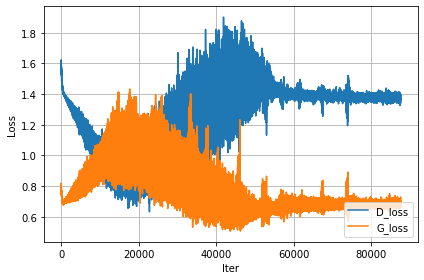

Epoch: [2502] [  30/  35] D_loss: 1.38170266, G_loss: 0.66620845
Epoch: [2502] completed	 D_loss: 1.37399673, G_loss: 0.66780996
Epoch: [2503] [  30/  35] D_loss: 1.36800337, G_loss: 0.68274188
Epoch: [2503] completed	 D_loss: 1.37059546, G_loss: 0.69087279
Epoch: [2504] [  30/  35] D_loss: 1.37137163, G_loss: 0.71299148
Epoch: [2504] completed	 D_loss: 1.34736872, G_loss: 0.68751496
Epoch: [2505] [  30/  35] D_loss: 1.36747885, G_loss: 0.68375582
Epoch: [2505] completed	 D_loss: 1.37430477, G_loss: 0.68820369
Epoch: [2506] [  30/  35] D_loss: 1.36750877, G_loss: 0.68060344
Epoch: [2506] completed	 D_loss: 1.34958529, G_loss: 0.69163036
Epoch: [2507] [  30/  35] D_loss: 1.36771345, G_loss: 0.67300576
Epoch: [2507] completed	 D_loss: 1.37851954, G_loss: 0.69018751
Epoch: [2508] [  30/  35] D_loss: 1.34593654, G_loss: 0.70067775
Epoch: [2508] completed	 D_loss: 1.36603022, G_loss: 0.68118542
Epoch: [2509] [  30/  35] D_loss: 1.36851275, G_loss: 0.67826110
Epoch: [2509] completed	 D_loss:

Epoch: [2566] [  30/  35] D_loss: 1.38071465, G_loss: 0.67850953
Epoch: [2566] completed	 D_loss: 1.38341439, G_loss: 0.66662145
Epoch: [2567] [  30/  35] D_loss: 1.38890147, G_loss: 0.66424382
Epoch: [2567] completed	 D_loss: 1.38004827, G_loss: 0.67032087
Epoch: [2568] [  30/  35] D_loss: 1.38077784, G_loss: 0.70060897
Epoch: [2568] completed	 D_loss: 1.38746870, G_loss: 0.71252394
Epoch: [2569] [  30/  35] D_loss: 1.38330817, G_loss: 0.68564165
Epoch: [2569] completed	 D_loss: 1.39132833, G_loss: 0.69625670
Epoch: [2570] [  30/  35] D_loss: 1.40043294, G_loss: 0.67948240
Epoch: [2570] completed	 D_loss: 1.37849426, G_loss: 0.67721123
Epoch: [2571] [  30/  35] D_loss: 1.40008187, G_loss: 0.67518473
Epoch: [2571] completed	 D_loss: 1.39106643, G_loss: 0.67228854
Epoch: [2572] [  30/  35] D_loss: 1.38229883, G_loss: 0.68747121
Epoch: [2572] completed	 D_loss: 1.37876773, G_loss: 0.68077964
Epoch: [2573] [  30/  35] D_loss: 1.37637699, G_loss: 0.68269151
Epoch: [2573] completed	 D_loss:

Epoch: [2602] [  30/  35] D_loss: 1.38157141, G_loss: 0.68077159
Epoch: [2602] completed	 D_loss: 1.37426662, G_loss: 0.67046785
Epoch: [2603] [  30/  35] D_loss: 1.36548138, G_loss: 0.70352674
Epoch: [2603] completed	 D_loss: 1.37737525, G_loss: 0.66852164
Epoch: [2604] [  30/  35] D_loss: 1.38097644, G_loss: 0.68754631
Epoch: [2604] completed	 D_loss: 1.38684702, G_loss: 0.67320597
Epoch: [2605] [  30/  35] D_loss: 1.39123011, G_loss: 0.67755902
Epoch: [2605] completed	 D_loss: 1.37254059, G_loss: 0.66418082
Epoch: [2606] [  30/  35] D_loss: 1.38697600, G_loss: 0.67945886
Epoch: [2606] completed	 D_loss: 1.38212073, G_loss: 0.66714907
Epoch: [2607] [  30/  35] D_loss: 1.37814283, G_loss: 0.67396665
Epoch: [2607] completed	 D_loss: 1.38512766, G_loss: 0.67038989
Epoch: [2608] [  30/  35] D_loss: 1.37526345, G_loss: 0.66517806
Epoch: [2608] completed	 D_loss: 1.32394290, G_loss: 0.69317991
Epoch: [2609] [  30/  35] D_loss: 1.36485958, G_loss: 0.66708171
Epoch: [2609] completed	 D_loss:

Epoch: [2666] [  30/  35] D_loss: 1.38673484, G_loss: 0.67186654
Epoch: [2666] completed	 D_loss: 1.38536668, G_loss: 0.66796225
Epoch: [2667] [  30/  35] D_loss: 1.38370013, G_loss: 0.67583925
Epoch: [2667] completed	 D_loss: 1.39846539, G_loss: 0.69206309
Epoch: [2668] [  30/  35] D_loss: 1.39881551, G_loss: 0.66419363
Epoch: [2668] completed	 D_loss: 1.38746786, G_loss: 0.66393697
Epoch: [2669] [  30/  35] D_loss: 1.38997447, G_loss: 0.68873864
Epoch: [2669] completed	 D_loss: 1.39110065, G_loss: 0.68728709
Epoch: [2670] [  30/  35] D_loss: 1.36975765, G_loss: 0.67768413
Epoch: [2670] completed	 D_loss: 1.37778163, G_loss: 0.68469906
Epoch: [2671] [  30/  35] D_loss: 1.37412405, G_loss: 0.69663727
Epoch: [2671] completed	 D_loss: 1.36831439, G_loss: 0.67228287
Epoch: [2672] [  30/  35] D_loss: 1.38666177, G_loss: 0.65890741
Epoch: [2672] completed	 D_loss: 1.37804544, G_loss: 0.68156326
Epoch: [2673] [  30/  35] D_loss: 1.37124658, G_loss: 0.68923515
Epoch: [2673] completed	 D_loss:

Epoch: [2702] [  30/  35] D_loss: 1.38508964, G_loss: 0.67950791
Epoch: [2702] completed	 D_loss: 1.39123321, G_loss: 0.66116184
Epoch: [2703] [  30/  35] D_loss: 1.38434839, G_loss: 0.67732900
Epoch: [2703] completed	 D_loss: 1.39274049, G_loss: 0.66909486
Epoch: [2704] [  30/  35] D_loss: 1.37813461, G_loss: 0.67164165
Epoch: [2704] completed	 D_loss: 1.37232041, G_loss: 0.67807823
Epoch: [2705] [  30/  35] D_loss: 1.37107754, G_loss: 0.67971849
Epoch: [2705] completed	 D_loss: 1.36110473, G_loss: 0.67627954
Epoch: [2706] [  30/  35] D_loss: 1.36816859, G_loss: 0.69450420
Epoch: [2706] completed	 D_loss: 1.36595047, G_loss: 0.68874466
Epoch: [2707] [  30/  35] D_loss: 1.36919785, G_loss: 0.68562812
Epoch: [2707] completed	 D_loss: 1.37499690, G_loss: 0.67112404
Epoch: [2708] [  30/  35] D_loss: 1.36742973, G_loss: 0.69018137
Epoch: [2708] completed	 D_loss: 1.36897993, G_loss: 0.68367451
Epoch: [2709] [  30/  35] D_loss: 1.36263752, G_loss: 0.69857520
Epoch: [2709] completed	 D_loss:

Epoch: [2766] [  30/  35] D_loss: 1.36490130, G_loss: 0.70218247
Epoch: [2766] completed	 D_loss: 1.38604140, G_loss: 0.67912728
Epoch: [2767] [  30/  35] D_loss: 1.37642646, G_loss: 0.67690206
Epoch: [2767] completed	 D_loss: 1.39179683, G_loss: 0.67798656
Epoch: [2768] [  30/  35] D_loss: 1.38337445, G_loss: 0.69063473
Epoch: [2768] completed	 D_loss: 1.38344240, G_loss: 0.67563403
Epoch: [2769] [  30/  35] D_loss: 1.38800716, G_loss: 0.68375850
Epoch: [2769] completed	 D_loss: 1.37517071, G_loss: 0.68830460
Epoch: [2770] [  30/  35] D_loss: 1.37433100, G_loss: 0.67192543
Epoch: [2770] completed	 D_loss: 1.38588190, G_loss: 0.67485690
Epoch: [2771] [  30/  35] D_loss: 1.35734653, G_loss: 0.67651868
Epoch: [2771] completed	 D_loss: 1.38312113, G_loss: 0.70410150
Epoch: [2772] [  30/  35] D_loss: 1.36824274, G_loss: 0.67353314
Epoch: [2772] completed	 D_loss: 1.39841986, G_loss: 0.68603724
Epoch: [2773] [  30/  35] D_loss: 1.36710739, G_loss: 0.68927038
Epoch: [2773] completed	 D_loss:

Epoch: [2802] [  30/  35] D_loss: 1.37847924, G_loss: 0.66104448
Epoch: [2802] completed	 D_loss: 1.36868107, G_loss: 0.69594991
Epoch: [2803] [  30/  35] D_loss: 1.37960601, G_loss: 0.68334889
Epoch: [2803] completed	 D_loss: 1.35659027, G_loss: 0.68984360
Epoch: [2804] [  30/  35] D_loss: 1.37676859, G_loss: 0.68401825
Epoch: [2804] completed	 D_loss: 1.38335025, G_loss: 0.69900990
Epoch: [2805] [  30/  35] D_loss: 1.37327266, G_loss: 0.67149186
Epoch: [2805] completed	 D_loss: 1.38044631, G_loss: 0.66542792
Epoch: [2806] [  30/  35] D_loss: 1.37910962, G_loss: 0.69071853
Epoch: [2806] completed	 D_loss: 1.37958670, G_loss: 0.68841016
Epoch: [2807] [  30/  35] D_loss: 1.35802102, G_loss: 0.69915932
Epoch: [2807] completed	 D_loss: 1.37425804, G_loss: 0.68526435
Epoch: [2808] [  30/  35] D_loss: 1.36838508, G_loss: 0.67854851
Epoch: [2808] completed	 D_loss: 1.36573124, G_loss: 0.67116880
Epoch: [2809] [  30/  35] D_loss: 1.37284899, G_loss: 0.68255818
Epoch: [2809] completed	 D_loss:

Epoch: [2866] [  30/  35] D_loss: 1.38480413, G_loss: 0.68221998
Epoch: [2866] completed	 D_loss: 1.39998603, G_loss: 0.67766804
Epoch: [2867] [  30/  35] D_loss: 1.37185681, G_loss: 0.67347443
Epoch: [2867] completed	 D_loss: 1.37339377, G_loss: 0.67877465
Epoch: [2868] [  30/  35] D_loss: 1.38320863, G_loss: 0.69059306
Epoch: [2868] completed	 D_loss: 1.37492704, G_loss: 0.68902445
Epoch: [2869] [  30/  35] D_loss: 1.36630929, G_loss: 0.67846948
Epoch: [2869] completed	 D_loss: 1.37222099, G_loss: 0.67249411
Epoch: [2870] [  30/  35] D_loss: 1.38948321, G_loss: 0.69083375
Epoch: [2870] completed	 D_loss: 1.37894082, G_loss: 0.66411495
Epoch: [2871] [  30/  35] D_loss: 1.37334609, G_loss: 0.69467604
Epoch: [2871] completed	 D_loss: 1.38989329, G_loss: 0.68209338
Epoch: [2872] [  30/  35] D_loss: 1.37980747, G_loss: 0.67337465
Epoch: [2872] completed	 D_loss: 1.39084268, G_loss: 0.69224596
Epoch: [2873] [  30/  35] D_loss: 1.37518358, G_loss: 0.67664194
Epoch: [2873] completed	 D_loss:

Epoch: [2902] [  30/  35] D_loss: 1.37035203, G_loss: 0.67646033
Epoch: [2902] completed	 D_loss: 1.37029147, G_loss: 0.69182438
Epoch: [2903] [  30/  35] D_loss: 1.39165854, G_loss: 0.67367923
Epoch: [2903] completed	 D_loss: 1.39334440, G_loss: 0.67484868
Epoch: [2904] [  30/  35] D_loss: 1.39079237, G_loss: 0.68233281
Epoch: [2904] completed	 D_loss: 1.36304080, G_loss: 0.70160258
Epoch: [2905] [  30/  35] D_loss: 1.38360214, G_loss: 0.68095243
Epoch: [2905] completed	 D_loss: 1.37395191, G_loss: 0.69839472
Epoch: [2906] [  30/  35] D_loss: 1.38750339, G_loss: 0.68505514
Epoch: [2906] completed	 D_loss: 1.37579119, G_loss: 0.67472428
Epoch: [2907] [  30/  35] D_loss: 1.38486958, G_loss: 0.69715619
Epoch: [2907] completed	 D_loss: 1.37929606, G_loss: 0.67697358
Epoch: [2908] [  30/  35] D_loss: 1.38599706, G_loss: 0.67672509
Epoch: [2908] completed	 D_loss: 1.38281107, G_loss: 0.68105793
Epoch: [2909] [  30/  35] D_loss: 1.38614678, G_loss: 0.67801219
Epoch: [2909] completed	 D_loss:

Epoch: [2966] [  30/  35] D_loss: 1.37654114, G_loss: 0.67587501
Epoch: [2966] completed	 D_loss: 1.38827598, G_loss: 0.67531013
Epoch: [2967] [  30/  35] D_loss: 1.37579143, G_loss: 0.69015175
Epoch: [2967] completed	 D_loss: 1.37994814, G_loss: 0.67864311
Epoch: [2968] [  30/  35] D_loss: 1.38686454, G_loss: 0.68861413
Epoch: [2968] completed	 D_loss: 1.37663007, G_loss: 0.67389488
Epoch: [2969] [  30/  35] D_loss: 1.38813460, G_loss: 0.68187422
Epoch: [2969] completed	 D_loss: 1.40064836, G_loss: 0.66752899
Epoch: [2970] [  30/  35] D_loss: 1.38551939, G_loss: 0.67147499
Epoch: [2970] completed	 D_loss: 1.38208044, G_loss: 0.68241823
Epoch: [2971] [  30/  35] D_loss: 1.38142645, G_loss: 0.68564773
Epoch: [2971] completed	 D_loss: 1.38252211, G_loss: 0.66901690
Epoch: [2972] [  30/  35] D_loss: 1.38351202, G_loss: 0.67864841
Epoch: [2972] completed	 D_loss: 1.38865113, G_loss: 0.68676090
Epoch: [2973] [  30/  35] D_loss: 1.38378072, G_loss: 0.68104392
Epoch: [2973] completed	 D_loss:

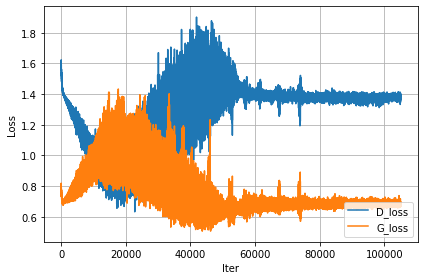

In [31]:
cgan.train()

---------- Networks architecture -------------
generator(
  (fc): Sequential(
    (0): Linear(in_features=122, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=256, out_features=20, bias=True)
    (4): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
)
Total number of parameters: 37180
-----------------------------------------------
discriminator(
  (fc): Sequential(
    (0): Linear(in_features=91, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=64, out_features=1, bias=True)
    (4): Sigmoid()
  )
)
Total number of parameters: 6081
models/07.17.40_epoch-3000/CGAN_history_epoch-3000.pkl


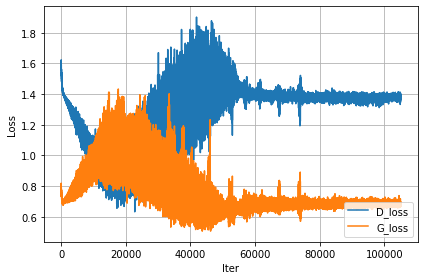

In [32]:
cgan=loadAndPlotModel(epochs,'07.17.40_epoch-3000')

In [34]:
cgan.generateDataBatch(data).head()

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[0, 6, 0],
        [0, 6, 1],
        [0, 2, 1],
        ...,
        [0, 2, 0],
        [0, 3, 1],
        [0, 4, 1]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (328309, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnair

,finalResult,codeModule,moduleSession,Q1-ExternalQuiz,Q1-DataPlus,Q1-DualPlus,Q1-Folder,Q1-Forumng,Q1-Glossary,Q1-HomePage,...,Q4-OuElluminate,Q4-OuWiki,Q4-PageClicks,Q4-Questionnaire,Q4-Quiz,Q4-RepeatActivity,Q4-Resource,Q4-SharedSubPage,Q4-SubPage,Q4-Url
0,Pass,CCC,J,3.0,9.0,3.0,4.0,3.0,7.0,2.0,...,107.0,48.0,109.0,76.0,51.0,65.0,9.0,241.0,24.0,28.0
1,Fail,CCC,B,2.0,0.0,5.0,0.0,4.0,0.0,3.0,...,64.0,50.0,87.0,59.0,48.0,66.0,0.0,0.0,30.0,44.0
2,Pass,BBB,J,3.0,0.0,0.0,4.0,2.0,0.0,1.0,...,60.0,47.0,87.0,54.0,49.0,69.0,0.0,0.0,29.0,45.0
3,Pass,DDD,B,0.0,13.0,6.0,11.0,8.0,7.0,1.0,...,78.0,34.0,54.0,54.0,53.0,40.0,6.0,61.0,30.0,45.0
4,Pass,GGG,B,4.0,2.0,4.0,1.0,3.0,4.0,4.0,...,85.0,34.0,87.0,68.0,53.0,27.0,8.0,120.0,28.0,33.0


In [681]:
cgan.generateDataBatch(data).max(axis=0)

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[1, 5, 1],
        [0, 3, 0],
        [1, 2, 1],
        ...,
        [1, 5, 0],
        [0, 1, 1],
        [0, 4, 0]])
MERGE STRATS FROM HERE!!!!
merge.columnss (335050, 23) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url'],
      dtype='object')
shape oof merge (335050, 23)
shape of batch from 8870 rows and type pof merge (512, 23) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder'

finalResult          Pass
codeModule            GGG
moduleSession           J
Q1-ExternalQuiz         8
Q1-DataPlus            17
Q1-DualPlus            13
Q1-Folder              17
Q1-Forumng             12
Q1-Glossary            12
Q1-HomePage             6
Q1-HtmlActivity        12
Q1-OuCollaborate       30
Q1-OuContent            9
Q1-OuElluminate         7
Q1-OuWiki              12
Q1-PageClicks           9
Q1-Questionnaire        8
Q1-Quiz                47
Q1-RepeatActivity      48
Q1-Resource            45
Q1-SharedSubPage       13
Q1-SubPage              8
Q1-Url                 34
Q2-ExternalQuiz         3
Q2-DataPlus             2
Q2-DualPlus             2
Q2-Folder               2
Q2-Forumng              2
Q2-Glossary             2
Q2-HomePage             2
Q2-HtmlActivity         2
Q2-OuCollaborate        2
Q2-OuContent            2
Q2-OuElluminate         2
Q2-OuWiki               2
Q2-PageClicks           2
Q2-Questionnaire        2
Q2-Quiz                 2
Q2-RepeatAct

In [35]:
#batches=batch_size
synthData=cgan.generateData(batches=280)


usePassed=False..
in dataframe... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 

shape oof merge (237168, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[37.5155, 10.5021, 23.8878,  ..., 21.9544, 14.7986, 17.1329],
        [35.2585, 11.9743, 21.5168,  ...,  0.7500, 13.2652, 19.9674],
        [37.6022,  5.2614, 22.0076,  ...,  2.6569, 15.9697, 24.7406],
        ...,
        [29.9260, 10.3144, 22.2577,  ..., 21.4587, 12.4510, 22.1485],
        [37.4804,  6.6677, 21.0961,  ...,  0.7500, 15.8790, 21.7636],
        [45.6950,  1.2429, 20.7132,  ...,  0.7500, 13.9440, 24.4979]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[74. 20. 47. ... 43. 29. 33.]
 [70. 23. 42. ...  0. 26. 39.]
 [74. 10. 43. ...  4. 31. 48.]
 ...
 [59. 20. 44. ... 42. 24. 43.]
 [74. 12. 41. ...  0. 31. 43.]
 [90.  1. 40. ...  0. 27. 48.]]
finalResult [0 1 1 1 1 0

(samples + 1) / 2 tensor([[22.0121, 19.3441, 27.6122,  ..., 89.3589, 13.3121, 13.9433],
        [47.0608,  1.4181, 21.5005,  ...,  5.5333, 14.0116, 28.2546],
        [41.6759,  9.4404, 22.4862,  ...,  0.7500, 12.8296, 24.3527],
        ...,
        [45.5537, 11.3634, 28.8532,  ..., 38.6244, 12.8937, 26.9519],
        [26.6123,  7.5002, 20.9554,  ..., 83.3652, 16.0764, 18.8291],
        [22.1132, 11.0498, 19.3668,  ...,  0.7500, 12.7144, 24.9285]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 43.  38.  54. ... 178.  26.  27.]
 [ 93.   2.  42. ...  10.  27.  56.]
 [ 82.  18.  44. ...   0.  25.  48.]
 ...
 [ 90.  22.  57. ...  76.  25.  53.]
 [ 52.  14.  41. ... 166.  31.  37.]
 [ 43.  21.  38. ...   0.  24.  49.]]
finalResult [0 0 1 0 0 1 0 0 1 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1

shape oof merge (381270, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

shape oof merge (82335, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Gl

merge.columnss (390468, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

values in condition_vec1 tensor([[0, 2, 0],
        [0, 2, 0],
        [0, 2, 0],
        ...,
        [0, 2, 0],
        [0, 2, 0],
        [0, 2, 0]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubP

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage', 'Q3-HtmlActivity',
       'Q3-OuCollaborate', 'Q3-OuContent', 'Q3-

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (180447, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (390468, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[47.5698,  0.7500, 20.7460,  ...,  0.7500, 16.7277, 29.0031],
        [35.2474,  7.5622, 21.9144,  ..., 18.8827, 15.3057, 24.5419],
        [33.1666,  8.4459, 20.0954,  ...,  0.7500, 14.3501, 23.7421],
        ...,
        [46.9440,  0.7500, 22.1547,  ...,  0.7500, 14.5637, 28.6170],
        [36.4701,  1.4475, 21.5557,  ...,  0.7500, 15.5911, 28.4039],
        [42.3633, 15.7741, 31.6556,  ..., 53.3128, 18.4641, 28.2377]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 94.   0.  40. ...   0.  32.  57.]
 [ 69.  14.  43. ...  37.  30.  48.]
 [ 65.  16.  39. ...   0.  28.  46.]
 ...
 [ 93.   0.  43. ...   0.  28.  56.]
 [ 72.   2.  42. ...   0.  30.  56.]
 [ 84.  31.  62. ... 106. 

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

np.argmax(sample_y_,axis=1 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[37.4358,  0.7500, 20.4660,  ...,  0.7500, 15.8805, 27.5215],
        [42.6024,  2.5571, 20.9633,  ...,  6.5367, 15.5528, 24.6781],
        [38.6584,  5.4702, 21.2449,  ...,  2.0199, 14.0473, 27.0356],
        ...,
        [43.1287,  5.6045, 21.9593,  ...,  0.7500, 15.3446, 22.0229],
        [34.8837,  5.8606, 21.8756,  ...,  0.7500, 15.4991, 19.9484],
        [28.4054,  5.3025, 20.7275,  ...,  0.7500, 14.6332, 25.2787]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[74.  0. 40. ...  0. 31. 54.]
 [84.  4. 41. ... 12. 30. 48.]
 [76. 10. 41. ...  3. 27. 53.]
 ...
 [85. 10. 43. ...  0. 30. 43.]
 [69. 11. 43. ...  0. 30. 39.]
 [56. 10. 40. ...  0. 28. 50.]]
finalResult [0 1 0 0 0 0

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (82335, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuW

values in condition_vec1 tensor([[1, 5, 0],
        [1, 5, 0],
        [1, 5, 0],
        ...,
        [1, 5, 0],
        [1, 5, 0],
        [1, 5, 0]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (390468, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubP

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[40.7763,  7.4335, 23.0543,  ...,  0.7500, 14.2282, 21.8510],
        [41.9413, 11.4880, 26.3854,  ...,  6.2567, 14.4722, 13.8662],
        [23.4695, 10.3972, 21.3573,  ..., 49.0835, 14.8279, 15.0947],
        ...,
        [16.6143,  9.6249, 21.0907,  ..., 52.2543, 13.4211, 14.6987],
        [41.7235,  5.6870, 21.4230,  ...,  0.7500, 14.5095, 22.0307],
        [43.4143,  1.7253, 20.9496,  ...,  0.7500, 14.3620, 26.0431]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 81.  14.  45. ...   0.  27.  43.]
 [ 83.  22.  52. ...  12.  28.  27.]
 [ 46.  20.  42. ...  97.  29.  29.]
 ...
 [ 32.  18.  41. ... 104.  26.  28.]
 [ 82.  10.  42. ...   0.  28.  43.]
 [ 86.   2.  41. ...   0. 

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

synthDataDf.finalResult 0      Pass
1      Pass
2      Pass
3      Pass
4      Pass
       ... 
507    Pass
508    Pass
509    Pass
510    Pass
511    Pass
Name: finalResult, Length: 512, dtype: object
in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
 

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[49.7698,  0.7500, 21.6624,  ...,  2.9060, 14.1765, 31.3682],
        [47.0694,  1.0836, 21.9560,  ...,  0.7500, 13.4007, 26.4453],
        [21.1753,  9.4585, 19.5179,  ...,  0.7500, 14.0385, 23.7653],
        ...,
        [35.8504,  5.8407, 22.6814,  ..., 67.3923, 14.2873, 24.6000],
        [30.0213,  7.5055, 23.5486,  ..., 71.7975, 15.5305, 17.7843],
        [47.8203,  0.7500, 20.8765,  ...,  7.8177, 13.8360, 27.2789]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 99.   0.  42. ...   5.  27.  62.]
 [ 93.   1.  43. ...   0.  26.  52.]
 [ 41.  18.  38. ...   0.  27.  47.]
 ...
 [ 71.  11.  44. ... 134.  28.  48.]
 [ 59.  14.  46. ... 143.  30.  35.]
 [ 95.   0.  41. ...  15. 

shape oof merge (381270, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (82335, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuW

randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (390468, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage', 'Q3-HtmlActivity',
       'Q3-OuCollaborate', 'Q3-OuContent', 'Q3-

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[0, 3, 1],
        [0, 3, 1],
        [0, 3, 1],
        ...,
        [0, 3, 1],
        [0, 3, 1],
        [0, 3, 1]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnair

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage', 'Q3-HtmlActivity',
       'Q3-OuCollaborate', 'Q3-OuContent', 'Q3-

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

MERGE STRATS FROM HERE!!!!
merge.columnss (82335, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
      

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (390468, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[33.3353,  7.1858, 20.3185,  ...,  8.8215, 15.4447, 23.3967],
        [12.3312, 13.7637, 20.1979,  ..., 18.2062, 13.1102, 19.0346],
        [35.7635,  3.8042, 21.5837,  ...,  8.9475, 15.7023, 27.4380],
        ...,
        [47.1634,  0.7500, 21.6077,  ...,  0.7500, 15.9079, 27.3846],
        [40.2481,  0.9899, 22.5384,  ...,  0.7500, 16.3466, 27.7204],
        [43.3332,  0.7500, 20.7848,  ...,  0.7500, 13.9161, 28.0904]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[66. 13. 40. ... 17. 30. 46.]
 [24. 27. 39. ... 35. 25. 37.]
 [71.  7. 42. ... 17. 30. 54.]
 ...
 [93.  0. 42. ...  0. 31. 54.]
 [79.  1. 44. ...  0. 32. 54.]
 [86.  0. 41. ...  0. 27. 55.]]
finalResult [1 0 1 0 1 1

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (82335, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuW

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (390468, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage', 'Q3-HtmlActivity',
       'Q3-OuCollaborate', 'Q3-OuContent', 'Q3-

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

values in condition_vec1 tensor([[0, 2, 1],
        [0, 2, 1],
        [0, 2, 1],
        ...,
        [0, 2, 1],
        [0, 2, 1],
        [0, 2, 1]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubP

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

 [  1.   0.   0. ...  95.  47.  53.]]
type of sample_y_and shape <class 'numpy.ndarray'> (512, 71)
np.argmax(sample_y_,axis=1 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (55252, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuW

randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (180447, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (82335, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Gl

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (390468, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

MERGE STRATS FROM HERE!!!!
merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[41.8051, 17.1396, 29.8063,  ..., 22.4813, 17.3846, 23.1153],
        [38.6402,  8.6306, 21.6858,  ...,  0.7500, 14.4880, 23.0521],
        [43.6115,  0.7500, 21.8923,  ...,  0.7500, 13.1295, 26.6392],
        ...,
        [28.7286, 15.0285, 23.4117,  ...,  0.7500, 11.6164, 18.0415],
        [37.5316, 18.7781, 31.6676,  ..., 76.2695, 15.1915, 16.3681],
        [32.1503,  0.7500, 20.0944,  ...,  0.7500, 16.4225, 27.0325]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 83.  33.  59. ...  44.  34.  45.]
 [ 76.  16.  42. ...   0.  28.  45.]
 [ 86.   0.  43. ...   0.  25.  52.]
 ...
 [ 56.  29.  46. ...   0.  22.  35.]
 [ 74.  37.  62. ... 152.  29.  32.]
 [ 63.   0.  39. ...   0. 

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

shape oof merge (419084, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

randomCodes in start-if: tensor([[2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],


COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (169205, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

MERGE STRATS FROM HERE!!!!
merge.columnss (180447, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

shape oof merge (82335, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Gl

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[1, 5, 0],
        [1, 5, 0],
        [1, 5, 0],
        ...,
        [1, 5, 0],
        [1, 5, 0],
        [1, 5, 0]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (390468, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnair

MERGE STRATS FROM HERE!!!!
merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (237168, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[0, 2, 1],
        [0, 2, 1],
        [0, 2, 1],
        ...,
        [0, 2, 1],
        [0, 2, 1],
        [0, 2, 1]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnair

merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (419084, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (608665, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

shape oof merge (432881, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (381270, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (189645, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (169205, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

merge.columnss (344989, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

merge.columnss (180447, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (82335, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Gl

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (390468, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

values in condition_vec1 tensor([[1, 6, 1],
        [1, 6, 1],
        [1, 6, 1],
        ...,
        [1, 6, 1],
        [1, 6, 1],
        [1, 6, 1]])
df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (118616, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubP

shape oof merge (237168, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

merge.columnss (933150, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (635748, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

MERGE STRATS FROM HERE!!!!
merge.columnss (441057, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (287757, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

MERGE STRATS FROM HERE!!!!
merge.columnss (674584, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

merge.columnss (541213, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

MERGE STRATS FROM HERE!!!!
merge.columnss (164095, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (932639, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

MERGE STRATS FROM HERE!!!!
merge.columnss (432881, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (213662, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

merge.columnss (55252, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuW

randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (365429, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

randomCodes in start-if: tensor([[2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],
        [2],


COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 63)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url',
       'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder',
       'Q3-Forumng', 'Q3-Glossary', 'Q3-Hom

merge.columnss (169205, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (344989, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

df_new shape should be rows,63 (17949, 63)
MERGE STRATS FROM HERE!!!!
merge.columnss (280092, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity'

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (180447, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (390468, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

MERGE STRATS FROM HERE!!!!
merge.columnss (346522, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
     

merge.columnss (212640, 63) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-Ou

shape oof merge (118616, 63)
shape of batch from 8870 rows and type pof merge (512, 63) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-G

In [36]:
synthData=synthData.loc[:,columnsToSelect]
synthData.columns=targetColumns
synthData.to_csv("./Q4_synthetic_cond_Q1-Q3.csv", columns=synthData.columns,index=False)

In [54]:
synthData['finalResult'].value_counts()

Pass    77488
Fail    65872
Name: finalResult, dtype: int64

In [55]:
synthData['moduleSession'].value_counts()

J    79153
B    64207
Name: moduleSession, dtype: int64

In [57]:
synthData['codeModule'].value_counts()

BBB    24677
FFF    24579
DDD    23272
CCC    21139
GGG    20563
EEE    20111
AAA     9019
Name: codeModule, dtype: int64